In [3]:
from matrix_factorization import BaselineModel, KernelMF, train_update_test_split

import pandas as pd
from sklearn.metrics import root_mean_squared_error

In [4]:
# Movie data found here https://grouplens.org/datasets/movielens/
# cols = ["user_id", "item_id", "rating", "timestamp"]
# movie_data = pd.read_csv(
#     "../data/ml-100k/u.data", names=cols, sep="\t", usecols=[0, 1, 2], engine="python"
# )

# Adaptation for ml-latest-small version of dataset
cols = ["userId", "movieId", "rating", "timestamp"]
# movie_data = pd.read_csv(
#     "ml-latest-small/ratings.csv", names=cols, sep="\t", usecols=[0, 1, 2], engine="python"
# )

movie_data = pd.read_csv(
    "ml-latest-small/ratings.csv", engine="python"
)

In [5]:
movie_data

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931
...,...,...,...,...
100831,610,166534,4.0,1493848402
100832,610,168248,5.0,1493850091
100833,610,168250,5.0,1494273047
100834,610,168252,5.0,1493846352


In [6]:
X = movie_data[["userId", "movieId"]]
y = movie_data["rating"]

In [7]:
# renaming columns for pypi library to work correctly
X = X.rename(columns={"userId":"user_id"})
X = X.rename(columns={"movieId":"item_id"})

In [8]:
movie_data_final = pd.concat([X, y], axis=1)

In [9]:
movie_data_final

,user_id,item_id,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0
...,...,...,...
100831,610,166534,4.0
100832,610,168248,5.0
100833,610,168250,5.0
100834,610,168252,5.0


In [37]:
# movie_data_final.isna()
rows_with_nan = movie_data_final[movie_data_final.isna().any(axis=1)]

In [10]:
# Prepare data for online learning
(
    X_train_initial,
    y_train_initial,
    X_train_update,
    y_train_update,
    X_test_update,
    y_test_update,
) = train_update_test_split(movie_data_final, frac_new_users=0.2)
# ) = train_update_test_split(movie_data, frac_new_users=0.2)

In [11]:
X_train_initial

,user_id,item_id
100587,610,98061
10998,68,4447
54082,356,48342
30291,212,1207
11742,71,609
...,...,...
78852,489,4054
7258,50,32657
56555,376,541
76593,480,3499


In [12]:
y_train_initial

100587    3.5
10998     4.0
54082     5.0
30291     3.5
11742     3.0
         ... 
78852     1.0
7258      3.5
56555     5.0
76593     3.0
38233     3.0
Name: rating, Length: 83152, dtype: float64

In [13]:
X_train_update

,user_id,item_id
8741,60,1203
37905,257,494
84602,543,101765
32068,220,318
71945,462,90866
...,...,...
5177,33,2501
3794,23,541
94010,599,5254
92918,599,780


In [14]:
y_train_update

8741     3.0
37905    3.0
84602    5.0
32068    5.0
71945    2.5
        ... 
5177     2.0
3794     5.0
94010    3.5
92918    3.5
47889    4.0
Name: rating, Length: 8842, dtype: float64

In [15]:
X_test_update

,user_id,item_id
52411,341,435
93874,599,4483
27228,184,172705
96109,603,32
1083,9,1270
...,...,...
77914,483,98585
89920,584,173
94660,599,58559
52835,346,6530


In [16]:
y_test_update

52411    3.0
93874    1.5
27228    5.0
96109    3.0
1083     5.0
        ... 
77914    3.5
89920    4.0
94660    3.5
52835    4.5
66411    2.0
Name: rating, Length: 8842, dtype: float64

In [37]:
# Initial training
matrix_fact = KernelMF(n_epochs=20, n_factors=100, verbose=1, lr=0.001, reg=0.005)

In [38]:
matrix_fact.fit(X_train_initial, y_train_initial)

Epoch  1 / 20  -  train_rmse: 0.9908606370496144
Epoch  2 / 20  -  train_rmse: 0.9646942928673473
Epoch  3 / 20  -  train_rmse: 0.9475215723317651
Epoch  4 / 20  -  train_rmse: 0.9347379740060606
Epoch  5 / 20  -  train_rmse: 0.9245831530853402
Epoch  6 / 20  -  train_rmse: 0.9161169131252159
Epoch  7 / 20  -  train_rmse: 0.9088380625216923
Epoch  8 / 20  -  train_rmse: 0.9024188985470719
Epoch  9 / 20  -  train_rmse: 0.8966448066714161
Epoch  10 / 20  -  train_rmse: 0.8913744883475714
Epoch  11 / 20  -  train_rmse: 0.8864912540866319
Epoch  12 / 20  -  train_rmse: 0.8819469627110944
Epoch  13 / 20  -  train_rmse: 0.8776326422393878
Epoch  14 / 20  -  train_rmse: 0.8735537448740682
Epoch  15 / 20  -  train_rmse: 0.8696555256936447
Epoch  16 / 20  -  train_rmse: 0.8658988366715559
Epoch  17 / 20  -  train_rmse: 0.8622792436938885
Epoch  18 / 20  -  train_rmse: 0.8587753471811304
Epoch  19 / 20  -  train_rmse: 0.855345443975685
Epoch  20 / 20  -  train_rmse: 0.8519978232247656


KernelMF(gamma=0.01, lr=0.001, n_epochs=20, reg=0.005)

In [39]:
# Update model with new users
matrix_fact.update_users(
    X_train_update, y_train_update, lr=0.001, n_epochs=20, verbose=1
)

Epoch  1 / 20  -  train_rmse: 0.9267355640101002
Epoch  2 / 20  -  train_rmse: 0.9123923306301637
Epoch  3 / 20  -  train_rmse: 0.9025503445198184
Epoch  4 / 20  -  train_rmse: 0.895419740139639
Epoch  5 / 20  -  train_rmse: 0.8899452499725353
Epoch  6 / 20  -  train_rmse: 0.8855857642522892
Epoch  7 / 20  -  train_rmse: 0.8819900903033405
Epoch  8 / 20  -  train_rmse: 0.8789411826858466
Epoch  9 / 20  -  train_rmse: 0.876276141774009
Epoch  10 / 20  -  train_rmse: 0.8739129900059123
Epoch  11 / 20  -  train_rmse: 0.8717885569268361
Epoch  12 / 20  -  train_rmse: 0.869846509286
Epoch  13 / 20  -  train_rmse: 0.8680491501305712
Epoch  14 / 20  -  train_rmse: 0.8663712437805832
Epoch  15 / 20  -  train_rmse: 0.8647974753816823
Epoch  16 / 20  -  train_rmse: 0.8633053585915009
Epoch  17 / 20  -  train_rmse: 0.8618855831472051
Epoch  18 / 20  -  train_rmse: 0.8605236237954392
Epoch  19 / 20  -  train_rmse: 0.8592170938663664
Epoch  20 / 20  -  train_rmse: 0.8579561266211527


In [40]:
pred = matrix_fact.predict(X_test_update)
rmse = mean_squared_error(y_test_update, pred, squared=False)
print(f"\nTest RMSE: {rmse:.4f}")

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 396. 5313.  651. ...  163. 1627. 8250.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)



Test RMSE: 0.8786


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [43]:
# pred = matrix_fact.predict(X_test_update)
rmse = root_mean_squared_error(y_test_update, pred)
# rmse = mean_squared_error(y_test_update, pred, squared=False)
print(f"\nTest RMSE: {rmse:.4f}")


Test RMSE: 0.8786


In [45]:
# Get recommendations
user = 200
items_known = X_train_initial.query("user_id == @user")["item_id"]
matrix_fact.recommend(user=user, items_known=items_known)

,user_id,item_id,rating_pred
79,200,50,4.617956
171,200,1193,4.486053
357,200,608,4.472589
423,200,1136,4.468778
178,200,527,4.457607
818,200,1221,4.453756
105,200,593,4.428470
133,200,912,4.418559
110,200,750,4.384666
95,200,1265,4.369119


# Hyper parameter search

In [53]:
learning_rates = [0.001, 0.0002]
regularization_params = [0.02, 0.005]
latent_features = [2, 4, 8, 16, 100]
n_epochs_steps = [10, 20, 100, 1000, 5000]


# learning_rates = [0.001]
# regularization_params = [0.02]
# latent_features = [2]
# n_epochs_steps = [10]



In [54]:
hyper_param_list = []
totalCombinations = len(learning_rates)*len(regularization_params)*len(latent_features)*len(n_epochs_steps)
combinationCount = 0
hyper_param_list.append(['learning_rate', 'regularization_param', 'latent_feature', 'n_epochs_step', 'trained_model', 'RMSE'])
for learning_rate in learning_rates:
    for regularization_param in regularization_params:
        for latent_feature in latent_features:
            for n_epochs_step in n_epochs_steps:
                combinationCount += 1
                print("Starting combination {} / {}".format(combinationCount, totalCombinations))
                print("Params= learning_rate:{} regularization_param:{} latent_feature:{} n_epochs_step:{}".format(learning_rate, regularization_param, latent_feature, n_epochs_step))
                matrix_fact = KernelMF(n_epochs=n_epochs_step, n_factors=latent_feature, verbose=1, lr=learning_rate, reg=regularization_param)
                print("****FIRST TRAIN******")
                matrix_fact_trained = matrix_fact.fit(X_train_initial, y_train_initial)
                print("****UPDATE USERS TRAIN******")
                matrix_fact.update_users(X_train_update, y_train_update, lr=learning_rate, n_epochs=n_epochs_step, verbose=1)
                print("****PREDICTING******")
                pred = matrix_fact.predict(X_test_update)
                rmse = root_mean_squared_error(y_test_update, pred)
                hyper_param_list.append([learning_rate, regularization_param, latent_feature, n_epochs_step, matrix_fact_trained, rmse])

Starting combination 1 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:2 n_epochs_step:10
****FIRST TRAIN******
Epoch  1 / 10  -  train_rmse: 0.96744387305306
Epoch  2 / 10  -  train_rmse: 0.9428506412118047
Epoch  3 / 10  -  train_rmse: 0.9278179724186442
Epoch  4 / 10  -  train_rmse: 0.9171773132261984
Epoch  5 / 10  -  train_rmse: 0.908988002277053
Epoch  6 / 10  -  train_rmse: 0.9023972127725264
Epoch  7 / 10  -  train_rmse: 0.8969328315244512
Epoch  8 / 10  -  train_rmse: 0.8922726470101199
Epoch  9 / 10  -  train_rmse: 0.888188962504921
Epoch  10 / 10  -  train_rmse: 0.8845836561341459
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.026099740379916
Epoch  2 / 10  -  train_rmse: 1.0064297072035355
Epoch  3 / 10  -  train_rmse: 0.9944403898239665
Epoch  4 / 10  -  train_rmse: 0.9857672692513016
Epoch  5 / 10  -  train_rmse: 0.9790189293496936
Epoch  6 / 10  -  train_rmse: 0.9737494316688419
Epoch  7 / 10  -  train_rmse: 0.9695434700668651
Epo

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 666. 5476.   nan ...  661. 2105. 1399.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 20  -  train_rmse: 0.9022565089649003
Epoch  7 / 20  -  train_rmse: 0.8967917869541989
Epoch  8 / 20  -  train_rmse: 0.8921168996844824
Epoch  9 / 20  -  train_rmse: 0.88806006018761
Epoch  10 / 20  -  train_rmse: 0.8844416503832893
Epoch  11 / 20  -  train_rmse: 0.8812200343338561
Epoch  12 / 20  -  train_rmse: 0.8782983689368276
Epoch  13 / 20  -  train_rmse: 0.875634620620221
Epoch  14 / 20  -  train_rmse: 0.873164017420717
Epoch  15 / 20  -  train_rmse: 0.8708835369653528
Epoch  16 / 20  -  train_rmse: 0.8687710473230493
Epoch  17 / 20  -  train_rmse: 0.8667870281509062
Epoch  18 / 20  -  train_rmse: 0.8649218571246875
Epoch  19 / 20  -  train_rmse: 0.8631700423856641
Epoch  20 / 20  -  train_rmse: 0.8615013073847881
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0175380754034784
Epoch  2 / 20  -  train_rmse: 0.9967204159728785
Epoch  3 / 20  -  train_rmse: 0.9842043111277814
Epoch  4 / 20  -  train_rmse: 0.9750797288254875
Epoch  5 / 20  -  train_rmse: 0.9

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1040. 5297.   nan ...  581. 6046. 2727.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 3 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:2 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 0.9671424532147579
Epoch  2 / 100  -  train_rmse: 0.9426591364393699
Epoch  3 / 100  -  train_rmse: 0.927635358517402
Epoch  4 / 100  -  train_rmse: 0.9169786847067908
Epoch  5 / 100  -  train_rmse: 0.908800017004222
Epoch  6 / 100  -  train_rmse: 0.9022374846720461
Epoch  7 / 100  -  train_rmse: 0.8967617318910682
Epoch  8 / 100  -  train_rmse: 0.8920818977197924
Epoch  9 / 100  -  train_rmse: 0.8880463951225384
Epoch  10 / 100  -  train_rmse: 0.8844179642616551
Epoch  11 / 100  -  train_rmse: 0.8811918683853406
Epoch  12 / 100  -  train_rmse: 0.8782630667122155
Epoch  13 / 100  -  train_rmse: 0.875588704297934
Epoch  14 / 100  -  train_rmse: 0.8731379735597644
Epoch  15 / 100  -  train_rmse: 0.8708535839615112
Epoch  16 / 100  -  train_rmse: 0.8687367323513464
Epoch  17 / 100  -  train_rmse: 0.8667490532186544
Epoch

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1298.  854.   nan ...  505. 5650. 2043.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.8967992672506769
Epoch  8 / 1000  -  train_rmse: 0.8921179643339375
Epoch  9 / 1000  -  train_rmse: 0.8880544463227162
Epoch  10 / 1000  -  train_rmse: 0.8844406339522636
Epoch  11 / 1000  -  train_rmse: 0.8812259640445962
Epoch  12 / 1000  -  train_rmse: 0.8782852450306747
Epoch  13 / 1000  -  train_rmse: 0.8756170632773674
Epoch  14 / 1000  -  train_rmse: 0.873155864270803
Epoch  15 / 1000  -  train_rmse: 0.8708825238596134
Epoch  16 / 1000  -  train_rmse: 0.8687544037717257
Epoch  17 / 1000  -  train_rmse: 0.8667718966885475
Epoch  18 / 1000  -  train_rmse: 0.8649024401344211
Epoch  19 / 1000  -  train_rmse: 0.863161007166177
Epoch  20 / 1000  -  train_rmse: 0.8614981315365917
Epoch  21 / 1000  -  train_rmse: 0.8599130270642082
Epoch  22 / 1000  -  train_rmse: 0.8584127073572566
Epoch  23 / 1000  -  train_rmse: 0.8569813381344324
Epoch  24 / 1000  -  train_rmse: 0.855616988808318
Epoch  25 / 1000  -  train_rmse: 0.8543141570574941
Epoch  26 / 1000  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1307. 3456.   nan ...  544. 8368. 1090.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 5 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:2 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 0.9673361984521184
Epoch  2 / 5000  -  train_rmse: 0.9427848011301799
Epoch  3 / 5000  -  train_rmse: 0.9277704863596516
Epoch  4 / 5000  -  train_rmse: 0.91708400236111
Epoch  5 / 5000  -  train_rmse: 0.9089059844375803
Epoch  6 / 5000  -  train_rmse: 0.9023184370964431
Epoch  7 / 5000  -  train_rmse: 0.8968472717328639
Epoch  8 / 5000  -  train_rmse: 0.892170999336256
Epoch  9 / 5000  -  train_rmse: 0.8880866938696299
Epoch  10 / 5000  -  train_rmse: 0.8844860351848675
Epoch  11 / 5000  -  train_rmse: 0.8812552696737653
Epoch  12 / 5000  -  train_rmse: 0.878318253167025
Epoch  13 / 5000  -  train_rmse: 0.8756449737878647
Epoch  14 / 5000  -  train_rmse: 0.8732036807175838
Epoch  15 / 5000  -  train_rmse: 0.870912275474231
Epoch  16 / 5000  -  train_rmse: 0.8688064080432076
Epoch  17 / 5000  -  train_rmse: 0.866801

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 779. 5441.   nan ...  732. 1663.  898.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 10  -  train_rmse: 0.9427835863534866
Epoch  3 / 10  -  train_rmse: 0.9277477733476535
Epoch  4 / 10  -  train_rmse: 0.9170126084886704
Epoch  5 / 10  -  train_rmse: 0.9088133568570811
Epoch  6 / 10  -  train_rmse: 0.902215027568166
Epoch  7 / 10  -  train_rmse: 0.8967159037483835
Epoch  8 / 10  -  train_rmse: 0.8920085905990195
Epoch  9 / 10  -  train_rmse: 0.8879135470815155
Epoch  10 / 10  -  train_rmse: 0.8842923745546915
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0262841898290735
Epoch  2 / 10  -  train_rmse: 1.0059618488352315
Epoch  3 / 10  -  train_rmse: 0.9940227574860572
Epoch  4 / 10  -  train_rmse: 0.985306981527086
Epoch  5 / 10  -  train_rmse: 0.9785807881188019
Epoch  6 / 10  -  train_rmse: 0.9732958760382189
Epoch  7 / 10  -  train_rmse: 0.9690957705509013
Epoch  8 / 10  -  train_rmse: 0.9656804991935003
Epoch  9 / 10  -  train_rmse: 0.9628992058093201
Epoch  10 / 10  -  train_rmse: 0.960553524196744
****PREDICTING******


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 158. 7707.   nan ...  962. 7746.  795.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 7 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:4 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  train_rmse: 0.9673388062692029
Epoch  2 / 20  -  train_rmse: 0.9426870092978152
Epoch  3 / 20  -  train_rmse: 0.9275924278795217
Epoch  4 / 20  -  train_rmse: 0.9168733540171469
Epoch  5 / 20  -  train_rmse: 0.9086730720260171
Epoch  6 / 20  -  train_rmse: 0.9020439530135942
Epoch  7 / 20  -  train_rmse: 0.8965463488719535
Epoch  8 / 20  -  train_rmse: 0.8918334063457309
Epoch  9 / 20  -  train_rmse: 0.887726797818581
Epoch  10 / 20  -  train_rmse: 0.8840953491769816
Epoch  11 / 20  -  train_rmse: 0.8808393384291796
Epoch  12 / 20  -  train_rmse: 0.8778788782663067
Epoch  13 / 20  -  train_rmse: 0.8751719001506674
Epoch  14 / 20  -  train_rmse: 0.872687169977637
Epoch  15 / 20  -  train_rmse: 0.8703718279814393
Epoch  16 / 20  -  train_rmse: 0.8682230883744064
Epoch  17 / 20  -  train_rmse: 0.8662135879961372
Epoch  18 / 20  -  tra

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 822. 7488.   nan ...  172. 4798. 1526.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 100  -  train_rmse: 0.9169928495127673
Epoch  5 / 100  -  train_rmse: 0.9087868259150514
Epoch  6 / 100  -  train_rmse: 0.9021802480106683
Epoch  7 / 100  -  train_rmse: 0.8966736736569543
Epoch  8 / 100  -  train_rmse: 0.8919879522186892
Epoch  9 / 100  -  train_rmse: 0.8878840352334336
Epoch  10 / 100  -  train_rmse: 0.8842653937614623
Epoch  11 / 100  -  train_rmse: 0.8810093435827727
Epoch  12 / 100  -  train_rmse: 0.8780461102972418
Epoch  13 / 100  -  train_rmse: 0.8753592845893494
Epoch  14 / 100  -  train_rmse: 0.8728704079052366
Epoch  15 / 100  -  train_rmse: 0.8705657811152929
Epoch  16 / 100  -  train_rmse: 0.8684226393459603
Epoch  17 / 100  -  train_rmse: 0.8664192585710383
Epoch  18 / 100  -  train_rmse: 0.8645355946746439
Epoch  19 / 100  -  train_rmse: 0.8627656707143063
Epoch  20 / 100  -  train_rmse: 0.8610650142676133
Epoch  21 / 100  -  train_rmse: 0.8594656972144054
Epoch  22 / 100  -  train_rmse: 0.8579563457260801
Epoch  23 / 100  -  train_rmse: 0.856

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1062. 7000.   nan ...  336. 7108. 1098.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.8966609934482357
Epoch  8 / 1000  -  train_rmse: 0.8919626729879152
Epoch  9 / 1000  -  train_rmse: 0.8878731789198819
Epoch  10 / 1000  -  train_rmse: 0.8842491184126047
Epoch  11 / 1000  -  train_rmse: 0.8809802811196499
Epoch  12 / 1000  -  train_rmse: 0.8780381956371092
Epoch  13 / 1000  -  train_rmse: 0.8753197107886984
Epoch  14 / 1000  -  train_rmse: 0.8728364017190378
Epoch  15 / 1000  -  train_rmse: 0.8705395298120089
Epoch  16 / 1000  -  train_rmse: 0.8684052992580101
Epoch  17 / 1000  -  train_rmse: 0.8663676445362255
Epoch  18 / 1000  -  train_rmse: 0.8644780283446473
Epoch  19 / 1000  -  train_rmse: 0.8626883535010859
Epoch  20 / 1000  -  train_rmse: 0.860996098323081
Epoch  21 / 1000  -  train_rmse: 0.8593902685721377
Epoch  22 / 1000  -  train_rmse: 0.8578806315396521
Epoch  23 / 1000  -  train_rmse: 0.8564213666805477
Epoch  24 / 1000  -  train_rmse: 0.855019959541056
Epoch  25 / 1000  -  train_rmse: 0.8536845515454454
Epoch  26 / 1000 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1366. 3480.   nan ...   74. 7854. 1718.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 10 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:4 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 0.9673851967248548
Epoch  2 / 5000  -  train_rmse: 0.9427943821845359
Epoch  3 / 5000  -  train_rmse: 0.9277159246963013
Epoch  4 / 5000  -  train_rmse: 0.9169966770294345
Epoch  5 / 5000  -  train_rmse: 0.9087885250986817
Epoch  6 / 5000  -  train_rmse: 0.902172091664912
Epoch  7 / 5000  -  train_rmse: 0.8966724172332452
Epoch  8 / 5000  -  train_rmse: 0.891963017367227
Epoch  9 / 5000  -  train_rmse: 0.8878577496749082
Epoch  10 / 5000  -  train_rmse: 0.8842111828895538
Epoch  11 / 5000  -  train_rmse: 0.8809540702180954
Epoch  12 / 5000  -  train_rmse: 0.877999796842082
Epoch  13 / 5000  -  train_rmse: 0.8753059526237305
Epoch  14 / 5000  -  train_rmse: 0.8728062512244482
Epoch  15 / 5000  -  train_rmse: 0.8705165643308863
Epoch  16 / 5000  -  train_rmse: 0.8683547814428194
Epoch  17 / 5000  -  train_rmse: 0.866

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1965. 7371.   nan ...  332. 8504. 1703.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 10  -  train_rmse: 0.9169653877880493
Epoch  5 / 10  -  train_rmse: 0.9086897230341829
Epoch  6 / 10  -  train_rmse: 0.9020169725088484
Epoch  7 / 10  -  train_rmse: 0.8964451539229028
Epoch  8 / 10  -  train_rmse: 0.891673356676
Epoch  9 / 10  -  train_rmse: 0.8875171145202443
Epoch  10 / 10  -  train_rmse: 0.8838198009757592
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0266423689951811
Epoch  2 / 10  -  train_rmse: 1.0066205255532097
Epoch  3 / 10  -  train_rmse: 0.994664244192039
Epoch  4 / 10  -  train_rmse: 0.9858911371995192
Epoch  5 / 10  -  train_rmse: 0.9791303535837934
Epoch  6 / 10  -  train_rmse: 0.97380589237984
Epoch  7 / 10  -  train_rmse: 0.9695607124051232
Epoch  8 / 10  -  train_rmse: 0.9660970369189024
Epoch  9 / 10  -  train_rmse: 0.9632550205180473
Epoch  10 / 10  -  train_rmse: 0.9608823518333511
****PREDICTING******
Starting combination 12 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:8 n_epochs_step:20
****

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1265. 7266.   nan ...  249. 4729. 2091.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 20  -  train_rmse: 0.9169547399235445
Epoch  5 / 20  -  train_rmse: 0.9086901681804309
Epoch  6 / 20  -  train_rmse: 0.9020183964462792
Epoch  7 / 20  -  train_rmse: 0.89644549608921
Epoch  8 / 20  -  train_rmse: 0.8916696986881908
Epoch  9 / 20  -  train_rmse: 0.8875102581181139
Epoch  10 / 20  -  train_rmse: 0.8838210531688908
Epoch  11 / 20  -  train_rmse: 0.8805099639741002
Epoch  12 / 20  -  train_rmse: 0.877495745233874
Epoch  13 / 20  -  train_rmse: 0.8747401457080249
Epoch  14 / 20  -  train_rmse: 0.8721882198761467
Epoch  15 / 20  -  train_rmse: 0.8698244234457426
Epoch  16 / 20  -  train_rmse: 0.8676355072857218
Epoch  17 / 20  -  train_rmse: 0.8655483536547838
Epoch  18 / 20  -  train_rmse: 0.8636125809501574
Epoch  19 / 20  -  train_rmse: 0.8617855145544605
Epoch  20 / 20  -  train_rmse: 0.8600226166720861
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0172392605369789
Epoch  2 / 20  -  train_rmse: 0.9966985795349459
Epoch  3 / 20  -  train_rmse: 0.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 779. 5354.   nan ...   71. 3463. 1673.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 100  -  train_rmse: 0.8962775842140803
Epoch  8 / 100  -  train_rmse: 0.8915055235612707
Epoch  9 / 100  -  train_rmse: 0.8873531806881501
Epoch  10 / 100  -  train_rmse: 0.8836509828649944
Epoch  11 / 100  -  train_rmse: 0.880339575890411
Epoch  12 / 100  -  train_rmse: 0.8773334506322676
Epoch  13 / 100  -  train_rmse: 0.8745598185705541
Epoch  14 / 100  -  train_rmse: 0.8720125319203957
Epoch  15 / 100  -  train_rmse: 0.8696571353522219
Epoch  16 / 100  -  train_rmse: 0.8674544541108528
Epoch  17 / 100  -  train_rmse: 0.8653799994317745
Epoch  18 / 100  -  train_rmse: 0.8634343911437081
Epoch  19 / 100  -  train_rmse: 0.8615911208694558
Epoch  20 / 100  -  train_rmse: 0.859844811557865
Epoch  21 / 100  -  train_rmse: 0.8581841745489542
Epoch  22 / 100  -  train_rmse: 0.8565977660303417
Epoch  23 / 100  -  train_rmse: 0.8550872080017784
Epoch  24 / 100  -  train_rmse: 0.8536454461145855
Epoch  25 / 100  -  train_rmse: 0.8522632003097628
Epoch  26 / 100  -  train_rmse: 0.85

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1319. 6641.   nan ...  335. 8054.  364.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.8964178738790675
Epoch  8 / 1000  -  train_rmse: 0.8916512804083349
Epoch  9 / 1000  -  train_rmse: 0.8874954541685081
Epoch  10 / 1000  -  train_rmse: 0.8838107952898117
Epoch  11 / 1000  -  train_rmse: 0.8804977243078607
Epoch  12 / 1000  -  train_rmse: 0.8774735532023346
Epoch  13 / 1000  -  train_rmse: 0.8747132492837847
Epoch  14 / 1000  -  train_rmse: 0.8721740966199005
Epoch  15 / 1000  -  train_rmse: 0.8698152068068338
Epoch  16 / 1000  -  train_rmse: 0.867606408606176
Epoch  17 / 1000  -  train_rmse: 0.8655384338370854
Epoch  18 / 1000  -  train_rmse: 0.8635922661705544
Epoch  19 / 1000  -  train_rmse: 0.8617517214615672
Epoch  20 / 1000  -  train_rmse: 0.8600108586190053
Epoch  21 / 1000  -  train_rmse: 0.8583443295226728
Epoch  22 / 1000  -  train_rmse: 0.856766259176164
Epoch  23 / 1000  -  train_rmse: 0.8552713500877369
Epoch  24 / 1000  -  train_rmse: 0.8538116971523697
Epoch  25 / 1000  -  train_rmse: 0.8524306378319387
Epoch  26 / 1000 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2527. 7118.   nan ...  532. 7296. 1624.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 15 / 100
Params= learning_rate:0.001 regularization_param:0.02 latent_feature:8 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 0.9675447851085166
Epoch  2 / 5000  -  train_rmse: 0.9428887011039354
Epoch  3 / 5000  -  train_rmse: 0.9277592003831856
Epoch  4 / 5000  -  train_rmse: 0.916997403892078
Epoch  5 / 5000  -  train_rmse: 0.9087355152512365
Epoch  6 / 5000  -  train_rmse: 0.9020495360810258
Epoch  7 / 5000  -  train_rmse: 0.896492470738626
Epoch  8 / 5000  -  train_rmse: 0.8917433977930551
Epoch  9 / 5000  -  train_rmse: 0.8875733330422083
Epoch  10 / 5000  -  train_rmse: 0.8838959453449242
Epoch  11 / 5000  -  train_rmse: 0.8805859064606454
Epoch  12 / 5000  -  train_rmse: 0.8775975587173598
Epoch  13 / 5000  -  train_rmse: 0.8748464616404232
Epoch  14 / 5000  -  train_rmse: 0.8722995915482367
Epoch  15 / 5000  -  train_rmse: 0.8699427952545864
Epoch  16 / 5000  -  train_rmse: 0.8677440483103201
Epoch  17 / 5000  -  train_rmse: 0.86

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1135. 1427.   nan ...  790. 8781. 1667.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 10  -  train_rmse: 0.9676189592193936
Epoch  2 / 10  -  train_rmse: 0.942709051447061
Epoch  3 / 10  -  train_rmse: 0.9274753456618566
Epoch  4 / 10  -  train_rmse: 0.9165879249018523
Epoch  5 / 10  -  train_rmse: 0.9081912178057228
Epoch  6 / 10  -  train_rmse: 0.901388317003686
Epoch  7 / 10  -  train_rmse: 0.8957068664055476
Epoch  8 / 10  -  train_rmse: 0.8908341211776142
Epoch  9 / 10  -  train_rmse: 0.8865630436296409
Epoch  10 / 10  -  train_rmse: 0.8827645107660479
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.02621183199051
Epoch  2 / 10  -  train_rmse: 1.0063959528092032
Epoch  3 / 10  -  train_rmse: 0.9942304364622014
Epoch  4 / 10  -  train_rmse: 0.9853577742183538
Epoch  5 / 10  -  train_rmse: 0.9785235161653383
Epoch  6 / 10  -  train_rmse: 0.9731377341522872
Epoch  7 / 10  -  train_rmse: 0.9688159735843728
Epoch  8 / 10  -  train_rmse: 0.9652796699403925
Epoch  9 / 10  -  train_rmse: 0.9623570888145727
Epoch  10 / 10  -  train_rmse: 0.9598863793

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 398. 4763.   nan ...  664. 7307.  639.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 20  -  train_rmse: 0.8959047854992024
Epoch  8 / 20  -  train_rmse: 0.8910226374036416
Epoch  9 / 20  -  train_rmse: 0.8867421624224899
Epoch  10 / 20  -  train_rmse: 0.8829516365856688
Epoch  11 / 20  -  train_rmse: 0.8795168160996806
Epoch  12 / 20  -  train_rmse: 0.8764011077555159
Epoch  13 / 20  -  train_rmse: 0.8735374934690863
Epoch  14 / 20  -  train_rmse: 0.870898542064533
Epoch  15 / 20  -  train_rmse: 0.8684353946205454
Epoch  16 / 20  -  train_rmse: 0.8661228005239326
Epoch  17 / 20  -  train_rmse: 0.8639553392803404
Epoch  18 / 20  -  train_rmse: 0.8619123905605716
Epoch  19 / 20  -  train_rmse: 0.8599690185029011
Epoch  20 / 20  -  train_rmse: 0.8581258233971885
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0186571330651888
Epoch  2 / 20  -  train_rmse: 0.9978724121197752
Epoch  3 / 20  -  train_rmse: 0.9853772715271298
Epoch  4 / 20  -  train_rmse: 0.9760847975591518
Epoch  5 / 20  -  train_rmse: 0.9689669081658293
Epoch  6 / 20  -  train_rmse: 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 510. 3637.   nan ...  890. 7411.  673.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 100  -  train_rmse: 0.9677762140591417
Epoch  2 / 100  -  train_rmse: 0.9429629496384819
Epoch  3 / 100  -  train_rmse: 0.9277018092483734
Epoch  4 / 100  -  train_rmse: 0.9168171401800329
Epoch  5 / 100  -  train_rmse: 0.9084108607249464
Epoch  6 / 100  -  train_rmse: 0.9016162102076086
Epoch  7 / 100  -  train_rmse: 0.8959491465273428
Epoch  8 / 100  -  train_rmse: 0.891050868304594
Epoch  9 / 100  -  train_rmse: 0.8867726832282192
Epoch  10 / 100  -  train_rmse: 0.8829811312528515
Epoch  11 / 100  -  train_rmse: 0.8795363096089232
Epoch  12 / 100  -  train_rmse: 0.8764255881278188
Epoch  13 / 100  -  train_rmse: 0.8735555738610277
Epoch  14 / 100  -  train_rmse: 0.8708969702670889
Epoch  15 / 100  -  train_rmse: 0.8684146059410651
Epoch  16 / 100  -  train_rmse: 0.8660976656193242
Epoch  17 / 100  -  train_rmse: 0.863922289160599
Epoch  18 / 100  -  train_rmse: 0.8618674871751348
Epoch  19 / 100  -  train_rmse: 0.8599244639415115
Epoch  20 / 100  -  train_rmse: 0.85806389

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 415. 6584.   nan ...  613. 5153.  886.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 1000  -  train_rmse: 0.9017176978171348
Epoch  7 / 1000  -  train_rmse: 0.89603250192887
Epoch  8 / 1000  -  train_rmse: 0.8911487513161973
Epoch  9 / 1000  -  train_rmse: 0.8868998408063564
Epoch  10 / 1000  -  train_rmse: 0.8830872638614902
Epoch  11 / 1000  -  train_rmse: 0.8796659540879116
Epoch  12 / 1000  -  train_rmse: 0.8765567434383207
Epoch  13 / 1000  -  train_rmse: 0.873694992695733
Epoch  14 / 1000  -  train_rmse: 0.8710696673798889
Epoch  15 / 1000  -  train_rmse: 0.8686073142298667
Epoch  16 / 1000  -  train_rmse: 0.8663219573536366
Epoch  17 / 1000  -  train_rmse: 0.8641350005176358
Epoch  18 / 1000  -  train_rmse: 0.8620990720948699
Epoch  19 / 1000  -  train_rmse: 0.8601598830099807
Epoch  20 / 1000  -  train_rmse: 0.8583225744528001
Epoch  21 / 1000  -  train_rmse: 0.8565694689896866
Epoch  22 / 1000  -  train_rmse: 0.8548888517048318
Epoch  23 / 1000  -  train_rmse: 0.8532815845703876
Epoch  24 / 1000  -  train_rmse: 0.8517512437570394
Epoch  25 / 1000  -

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[  40. 3842.   nan ...  635. 8705. 2653.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 5000  -  train_rmse: 0.9272867208392496
Epoch  4 / 5000  -  train_rmse: 0.9163753323458141
Epoch  5 / 5000  -  train_rmse: 0.9079914295839149
Epoch  6 / 5000  -  train_rmse: 0.9011971336749505
Epoch  7 / 5000  -  train_rmse: 0.8955152353278291
Epoch  8 / 5000  -  train_rmse: 0.8906303049831343
Epoch  9 / 5000  -  train_rmse: 0.8863685534487709
Epoch  10 / 5000  -  train_rmse: 0.882563524101047
Epoch  11 / 5000  -  train_rmse: 0.8791378019275629
Epoch  12 / 5000  -  train_rmse: 0.8760165041791722
Epoch  13 / 5000  -  train_rmse: 0.8731465197337072
Epoch  14 / 5000  -  train_rmse: 0.8705051817098677
Epoch  15 / 5000  -  train_rmse: 0.8680264293020699
Epoch  16 / 5000  -  train_rmse: 0.8657367614655418
Epoch  17 / 5000  -  train_rmse: 0.8635513062399867
Epoch  18 / 5000  -  train_rmse: 0.8615102452453228
Epoch  19 / 5000  -  train_rmse: 0.8595545692705734
Epoch  20 / 5000  -  train_rmse: 0.8577051929973558
Epoch  21 / 5000  -  train_rmse: 0.8559282501725044
Epoch  22 / 5000  - 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 209. 7846.   nan ... 1313. 4482.  363.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 10  -  train_rmse: 0.9271547708788723
Epoch  4 / 10  -  train_rmse: 0.9148290986931942
Epoch  5 / 10  -  train_rmse: 0.9050431510740023
Epoch  6 / 10  -  train_rmse: 0.8969372299809467
Epoch  7 / 10  -  train_rmse: 0.8899968852263067
Epoch  8 / 10  -  train_rmse: 0.8838625240128589
Epoch  9 / 10  -  train_rmse: 0.8783715148108349
Epoch  10 / 10  -  train_rmse: 0.8733801079668387
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.027885321528138
Epoch  2 / 10  -  train_rmse: 1.0072503467524208
Epoch  3 / 10  -  train_rmse: 0.9943996031373458
Epoch  4 / 10  -  train_rmse: 0.9847216380769146
Epoch  5 / 10  -  train_rmse: 0.9771289138223975
Epoch  6 / 10  -  train_rmse: 0.9709457629873168
Epoch  7 / 10  -  train_rmse: 0.9658816667222592
Epoch  8 / 10  -  train_rmse: 0.9615391322067598
Epoch  9 / 10  -  train_rmse: 0.9578951424122587
Epoch  10 / 10  -  train_rmse: 0.9546781773487042
****PREDICTING******
Starting combination 22 / 100
Params= learning_rate:0.001 regulariz

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2280. 3940.   nan ...   69. 7492.  596.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 20  -  train_rmse: 0.927063180522373
Epoch  4 / 20  -  train_rmse: 0.9147785561419454
Epoch  5 / 20  -  train_rmse: 0.9050202023932031
Epoch  6 / 20  -  train_rmse: 0.8969122010125554
Epoch  7 / 20  -  train_rmse: 0.8899629261347974
Epoch  8 / 20  -  train_rmse: 0.8838574330992793
Epoch  9 / 20  -  train_rmse: 0.8783880524027112
Epoch  10 / 20  -  train_rmse: 0.8734011550585851
Epoch  11 / 20  -  train_rmse: 0.868825770369105
Epoch  12 / 20  -  train_rmse: 0.8645822852569597
Epoch  13 / 20  -  train_rmse: 0.8606130634731416
Epoch  14 / 20  -  train_rmse: 0.8568569995780252
Epoch  15 / 20  -  train_rmse: 0.8532992815568856
Epoch  16 / 20  -  train_rmse: 0.8499066373443833
Epoch  17 / 20  -  train_rmse: 0.8466690855489676
Epoch  18 / 20  -  train_rmse: 0.8435490935197325
Epoch  19 / 20  -  train_rmse: 0.8405451424601375
Epoch  20 / 20  -  train_rmse: 0.8376288629262411
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0203909708898071
Epoch  2 / 20  -  train_rmse: 0

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1548. 6728.   nan ...  418. 4776.  723.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 100  -  train_rmse: 0.9274497476051694
Epoch  4 / 100  -  train_rmse: 0.9151719198162886
Epoch  5 / 100  -  train_rmse: 0.9054493098888324
Epoch  6 / 100  -  train_rmse: 0.897354298830799
Epoch  7 / 100  -  train_rmse: 0.8904082894609767
Epoch  8 / 100  -  train_rmse: 0.8842999063204541
Epoch  9 / 100  -  train_rmse: 0.8788248913802176
Epoch  10 / 100  -  train_rmse: 0.8738496337315934
Epoch  11 / 100  -  train_rmse: 0.8692737349635599
Epoch  12 / 100  -  train_rmse: 0.8650220122340142
Epoch  13 / 100  -  train_rmse: 0.8610404179276963
Epoch  14 / 100  -  train_rmse: 0.8572874643148685
Epoch  15 / 100  -  train_rmse: 0.8537337022753966
Epoch  16 / 100  -  train_rmse: 0.8503361077188797
Epoch  17 / 100  -  train_rmse: 0.8470863611674732
Epoch  18 / 100  -  train_rmse: 0.843965166922537
Epoch  19 / 100  -  train_rmse: 0.8409556450042707
Epoch  20 / 100  -  train_rmse: 0.8380384139667114
Epoch  21 / 100  -  train_rmse: 0.8352117768939967
Epoch  22 / 100  -  train_rmse: 0.832460

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 286. 6796.   nan ...  270. 7436. 1088.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 1000  -  train_rmse: 0.9706370100558558
Epoch  2 / 1000  -  train_rmse: 0.9443748356989077
Epoch  3 / 1000  -  train_rmse: 0.9276386788277562
Epoch  4 / 1000  -  train_rmse: 0.9153052194741133
Epoch  5 / 1000  -  train_rmse: 0.9055422720342119
Epoch  6 / 1000  -  train_rmse: 0.8974400824945009
Epoch  7 / 1000  -  train_rmse: 0.8904662719565337
Epoch  8 / 1000  -  train_rmse: 0.8843474194471704
Epoch  9 / 1000  -  train_rmse: 0.8788495154929936
Epoch  10 / 1000  -  train_rmse: 0.873877325047775
Epoch  11 / 1000  -  train_rmse: 0.8692891978856796
Epoch  12 / 1000  -  train_rmse: 0.8650351704331731
Epoch  13 / 1000  -  train_rmse: 0.8610712601388236
Epoch  14 / 1000  -  train_rmse: 0.8573037728519981
Epoch  15 / 1000  -  train_rmse: 0.8537447327792265
Epoch  16 / 1000  -  train_rmse: 0.8503499094953975
Epoch  17 / 1000  -  train_rmse: 0.8471027635967423
Epoch  18 / 1000  -  train_rmse: 0.8439953131248644
Epoch  19 / 1000  -  train_rmse: 0.8409788635772716
Epoch  20 / 1000  -  t

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 646. 4119.   nan ...  975. 7757. 2458.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 5000  -  train_rmse: 0.9701784126524333
Epoch  2 / 5000  -  train_rmse: 0.9438311504551349
Epoch  3 / 5000  -  train_rmse: 0.9271392278271692
Epoch  4 / 5000  -  train_rmse: 0.9148207485006995
Epoch  5 / 5000  -  train_rmse: 0.9050598554797653
Epoch  6 / 5000  -  train_rmse: 0.8969577624067274
Epoch  7 / 5000  -  train_rmse: 0.8899962336054403
Epoch  8 / 5000  -  train_rmse: 0.8838726987109351
Epoch  9 / 5000  -  train_rmse: 0.8783720334146158
Epoch  10 / 5000  -  train_rmse: 0.8733901907506244
Epoch  11 / 5000  -  train_rmse: 0.8688034500692859
Epoch  12 / 5000  -  train_rmse: 0.8645226812505518
Epoch  13 / 5000  -  train_rmse: 0.8605300726566761
Epoch  14 / 5000  -  train_rmse: 0.8567637387815807
Epoch  15 / 5000  -  train_rmse: 0.853184126984601
Epoch  16 / 5000  -  train_rmse: 0.849763511642695
Epoch  17 / 5000  -  train_rmse: 0.8464926480375716
Epoch  18 / 5000  -  train_rmse: 0.8433526261951634
Epoch  19 / 5000  -  train_rmse: 0.8403266707242945
Epoch  20 / 5000  -  tr

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1269. 5227.   nan ...  209. 8590.  285.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  8 / 10  -  train_rmse: 0.891831990110959
Epoch  9 / 10  -  train_rmse: 0.8877541410303396
Epoch  10 / 10  -  train_rmse: 0.884152171152176
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0257001477299752
Epoch  2 / 10  -  train_rmse: 1.0058234996588657
Epoch  3 / 10  -  train_rmse: 0.9938920627326651
Epoch  4 / 10  -  train_rmse: 0.9851320438179891
Epoch  5 / 10  -  train_rmse: 0.9784145531127479
Epoch  6 / 10  -  train_rmse: 0.9731224674285154
Epoch  7 / 10  -  train_rmse: 0.9689055198327778
Epoch  8 / 10  -  train_rmse: 0.9654974223293965
Epoch  9 / 10  -  train_rmse: 0.9627166728420491
Epoch  10 / 10  -  train_rmse: 0.9603764283146873
****PREDICTING******
Starting combination 27 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:2 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  train_rmse: 0.9672223689439214
Epoch  2 / 20  -  train_rmse: 0.9425845663328967
Epoch  3 / 20  -  train_rmse: 0.9275603883084103
Epoch  4 / 20  -  train_r

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1627. 4781.   nan ... 1156. 7595. 1329.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 20  -  train_rmse: 0.9021138541894693
Epoch  7 / 20  -  train_rmse: 0.8966250872402749
Epoch  8 / 20  -  train_rmse: 0.8919491723634022
Epoch  9 / 20  -  train_rmse: 0.8878695771386715
Epoch  10 / 20  -  train_rmse: 0.8842694732999972
Epoch  11 / 20  -  train_rmse: 0.8810371866599077
Epoch  12 / 20  -  train_rmse: 0.8781093862059084
Epoch  13 / 20  -  train_rmse: 0.87543520563153
Epoch  14 / 20  -  train_rmse: 0.872974128689146
Epoch  15 / 20  -  train_rmse: 0.8706980701530573
Epoch  16 / 20  -  train_rmse: 0.8686052441785505
Epoch  17 / 20  -  train_rmse: 0.8665797027624237
Epoch  18 / 20  -  train_rmse: 0.8647162365801331
Epoch  19 / 20  -  train_rmse: 0.8629518410843013
Epoch  20 / 20  -  train_rmse: 0.8612821161019036
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0169542166715788
Epoch  2 / 20  -  train_rmse: 0.9964070624802747
Epoch  3 / 20  -  train_rmse: 0.9837757643822308
Epoch  4 / 20  -  train_rmse: 0.9745562125961923
Epoch  5 / 20  -  train_rmse: 0.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2263. 7672.   nan ...  489. 8009. 1428.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 28 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:2 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 0.9672312045697917
Epoch  2 / 100  -  train_rmse: 0.9425693828203994
Epoch  3 / 100  -  train_rmse: 0.9275342459925383
Epoch  4 / 100  -  train_rmse: 0.916863913984841
Epoch  5 / 100  -  train_rmse: 0.9086795494449624
Epoch  6 / 100  -  train_rmse: 0.9020967569667878
Epoch  7 / 100  -  train_rmse: 0.8966174926244735
Epoch  8 / 100  -  train_rmse: 0.891936734004073
Epoch  9 / 100  -  train_rmse: 0.8878612519054944
Epoch  10 / 100  -  train_rmse: 0.8842515280472965
Epoch  11 / 100  -  train_rmse: 0.8810135923778125
Epoch  12 / 100  -  train_rmse: 0.8780796378479271
Epoch  13 / 100  -  train_rmse: 0.8753977998801732
Epoch  14 / 100  -  train_rmse: 0.8729340961138828
Epoch  15 / 100  -  train_rmse: 0.8706392730425072
Epoch  16 / 100  -  train_rmse: 0.8685119427392682
Epoch  17 / 100  -  train_rmse: 0.8665270043015081
Ep

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 737. 7594.   nan ...  414. 7007. 1597.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 29 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:2 n_epochs_step:1000
****FIRST TRAIN******
Epoch  1 / 1000  -  train_rmse: 0.9673474907888707
Epoch  2 / 1000  -  train_rmse: 0.9426639728599663
Epoch  3 / 1000  -  train_rmse: 0.9275696037701548
Epoch  4 / 1000  -  train_rmse: 0.9168840057088498
Epoch  5 / 1000  -  train_rmse: 0.9087307713315238
Epoch  6 / 1000  -  train_rmse: 0.9021285218939044
Epoch  7 / 1000  -  train_rmse: 0.8966396282929279
Epoch  8 / 1000  -  train_rmse: 0.891976534628439
Epoch  9 / 1000  -  train_rmse: 0.8878898648867026
Epoch  10 / 1000  -  train_rmse: 0.8842836150004034
Epoch  11 / 1000  -  train_rmse: 0.8810577480465789
Epoch  12 / 1000  -  train_rmse: 0.8781179416820967
Epoch  13 / 1000  -  train_rmse: 0.8754457919900124
Epoch  14 / 1000  -  train_rmse: 0.8729761240864368
Epoch  15 / 1000  -  train_rmse: 0.8706859550611306
Epoch  16 / 1000  -  train_rmse: 0.8685584041487864
Epoch  17 / 1000  -  train_rmse: 0.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 900. 6648.   nan ...  904. 7607. 1759.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 5000  -  train_rmse: 0.9274439897366824
Epoch  4 / 5000  -  train_rmse: 0.9167546586701777
Epoch  5 / 5000  -  train_rmse: 0.9085759976866886
Epoch  6 / 5000  -  train_rmse: 0.9019897323733916
Epoch  7 / 5000  -  train_rmse: 0.8965004955071535
Epoch  8 / 5000  -  train_rmse: 0.8918212585764553
Epoch  9 / 5000  -  train_rmse: 0.8877449260557746
Epoch  10 / 5000  -  train_rmse: 0.8841340479429552
Epoch  11 / 5000  -  train_rmse: 0.8809015626570629
Epoch  12 / 5000  -  train_rmse: 0.8779736319358734
Epoch  13 / 5000  -  train_rmse: 0.8753029664868703
Epoch  14 / 5000  -  train_rmse: 0.8728259373280732
Epoch  15 / 5000  -  train_rmse: 0.8705388918345041
Epoch  16 / 5000  -  train_rmse: 0.8684075776639918
Epoch  17 / 5000  -  train_rmse: 0.866409170873437
Epoch  18 / 5000  -  train_rmse: 0.8645335545026882
Epoch  19 / 5000  -  train_rmse: 0.8627744220392095
Epoch  20 / 5000  -  train_rmse: 0.8610969097474837
Epoch  21 / 5000  -  train_rmse: 0.8595072121624443
Epoch  22 / 5000  - 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[  72. 5691.   nan ...   43. 2447. 2255.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  5 / 10  -  train_rmse: 0.908691971470452
Epoch  6 / 10  -  train_rmse: 0.9020646369905826
Epoch  7 / 10  -  train_rmse: 0.8965308259905126
Epoch  8 / 10  -  train_rmse: 0.8918296707630583
Epoch  9 / 10  -  train_rmse: 0.8877143902368805
Epoch  10 / 10  -  train_rmse: 0.8840877673064491
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0253169673207583
Epoch  2 / 10  -  train_rmse: 1.005397015496155
Epoch  3 / 10  -  train_rmse: 0.9935351572467717
Epoch  4 / 10  -  train_rmse: 0.9847494847522041
Epoch  5 / 10  -  train_rmse: 0.9780705653080214
Epoch  6 / 10  -  train_rmse: 0.972782449207848
Epoch  7 / 10  -  train_rmse: 0.968553918955501
Epoch  8 / 10  -  train_rmse: 0.9651377861771118
Epoch  9 / 10  -  train_rmse: 0.9623257933668075
Epoch  10 / 10  -  train_rmse: 0.9599850301252937
****PREDICTING******


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1600. 5893.   nan ...  506. 8539. 1248.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 32 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:4 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  train_rmse: 0.9672118094655159
Epoch  2 / 20  -  train_rmse: 0.9425571091175734
Epoch  3 / 20  -  train_rmse: 0.9274803054226765
Epoch  4 / 20  -  train_rmse: 0.9167739576276719
Epoch  5 / 20  -  train_rmse: 0.9085443695094869
Epoch  6 / 20  -  train_rmse: 0.9019270388681442
Epoch  7 / 20  -  train_rmse: 0.8964038762057376
Epoch  8 / 20  -  train_rmse: 0.8916842932932942
Epoch  9 / 20  -  train_rmse: 0.8875648667131025
Epoch  10 / 20  -  train_rmse: 0.8839204160780592
Epoch  11 / 20  -  train_rmse: 0.8806367091052761
Epoch  12 / 20  -  train_rmse: 0.8776686820318077
Epoch  13 / 20  -  train_rmse: 0.8749509904665227
Epoch  14 / 20  -  train_rmse: 0.872431775849112
Epoch  15 / 20  -  train_rmse: 0.8701002571189336
Epoch  16 / 20  -  train_rmse: 0.8679301293301644
Epoch  17 / 20  -  train_rmse: 0.8658921979175999
Epoch  18 / 20  -  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 225. 7316.   nan ...  682. 7629.  936.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 100  -  train_rmse: 0.9274309051436291
Epoch  4 / 100  -  train_rmse: 0.9167324683251824
Epoch  5 / 100  -  train_rmse: 0.9085196396549479
Epoch  6 / 100  -  train_rmse: 0.9018902151935333
Epoch  7 / 100  -  train_rmse: 0.8963881030537801
Epoch  8 / 100  -  train_rmse: 0.8916824510186416
Epoch  9 / 100  -  train_rmse: 0.8875726056957342
Epoch  10 / 100  -  train_rmse: 0.8839253056532269
Epoch  11 / 100  -  train_rmse: 0.8806694464921576
Epoch  12 / 100  -  train_rmse: 0.8776971157340051
Epoch  13 / 100  -  train_rmse: 0.8749785342062443
Epoch  14 / 100  -  train_rmse: 0.872484105660877
Epoch  15 / 100  -  train_rmse: 0.870161020542195
Epoch  16 / 100  -  train_rmse: 0.8679944823150229
Epoch  17 / 100  -  train_rmse: 0.865962367693339
Epoch  18 / 100  -  train_rmse: 0.864049723815941
Epoch  19 / 100  -  train_rmse: 0.8622484775139885
Epoch  20 / 100  -  train_rmse: 0.8605373364474184
Epoch  21 / 100  -  train_rmse: 0.858907151978927
Epoch  22 / 100  -  train_rmse: 0.857354318

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2062. 7623.   nan ...  206. 7012.  185.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  9 / 1000  -  train_rmse: 0.8875929127401413
Epoch  10 / 1000  -  train_rmse: 0.8839553509133333
Epoch  11 / 1000  -  train_rmse: 0.8806967006712748
Epoch  12 / 1000  -  train_rmse: 0.8777354005501324
Epoch  13 / 1000  -  train_rmse: 0.8750421445934886
Epoch  14 / 1000  -  train_rmse: 0.8725377520697604
Epoch  15 / 1000  -  train_rmse: 0.8702251616941594
Epoch  16 / 1000  -  train_rmse: 0.8680684760794553
Epoch  17 / 1000  -  train_rmse: 0.8660494802352444
Epoch  18 / 1000  -  train_rmse: 0.864148614789875
Epoch  19 / 1000  -  train_rmse: 0.8623523382047851
Epoch  20 / 1000  -  train_rmse: 0.8606509049472743
Epoch  21 / 1000  -  train_rmse: 0.8590376909315186
Epoch  22 / 1000  -  train_rmse: 0.8574993836644395
Epoch  23 / 1000  -  train_rmse: 0.8560337720111048
Epoch  24 / 1000  -  train_rmse: 0.8546242496580525
Epoch  25 / 1000  -  train_rmse: 0.8532759297893443
Epoch  26 / 1000  -  train_rmse: 0.8519803485411708
Epoch  27 / 1000  -  train_rmse: 0.8507366716736509
Epoch  28 / 10

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[  12. 3742.   nan ...  120. 5085. 3052.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 5000  -  train_rmse: 0.967189935639893
Epoch  2 / 5000  -  train_rmse: 0.9424496625040835
Epoch  3 / 5000  -  train_rmse: 0.9274023303477963
Epoch  4 / 5000  -  train_rmse: 0.9166816991055887
Epoch  5 / 5000  -  train_rmse: 0.9084633184474745
Epoch  6 / 5000  -  train_rmse: 0.9018685451414986
Epoch  7 / 5000  -  train_rmse: 0.8963696819215856
Epoch  8 / 5000  -  train_rmse: 0.8916569977041603
Epoch  9 / 5000  -  train_rmse: 0.8875456674625116
Epoch  10 / 5000  -  train_rmse: 0.8839137282559805
Epoch  11 / 5000  -  train_rmse: 0.8806571529255683
Epoch  12 / 5000  -  train_rmse: 0.8776891462936286
Epoch  13 / 5000  -  train_rmse: 0.8749843732713503
Epoch  14 / 5000  -  train_rmse: 0.8724966197268833
Epoch  15 / 5000  -  train_rmse: 0.8701807978092033
Epoch  16 / 5000  -  train_rmse: 0.8680181207770171
Epoch  17 / 5000  -  train_rmse: 0.8660129621129448
Epoch  18 / 5000  -  train_rmse: 0.8640946532089232
Epoch  19 / 5000  -  train_rmse: 0.8622997783170726
Epoch  20 / 5000  -  t

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 294. 5673.   nan ...  313. 4595. 1277.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 36 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:8 n_epochs_step:10
****FIRST TRAIN******
Epoch  1 / 10  -  train_rmse: 0.9675720353471247
Epoch  2 / 10  -  train_rmse: 0.9428559826999809
Epoch  3 / 10  -  train_rmse: 0.9277361822174482
Epoch  4 / 10  -  train_rmse: 0.9169386508239208
Epoch  5 / 10  -  train_rmse: 0.9086471012722923
Epoch  6 / 10  -  train_rmse: 0.9019815228897359
Epoch  7 / 10  -  train_rmse: 0.8963942428121427
Epoch  8 / 10  -  train_rmse: 0.8916196295505577
Epoch  9 / 10  -  train_rmse: 0.8874475990453495
Epoch  10 / 10  -  train_rmse: 0.8837413221048395
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0258207701948114
Epoch  2 / 10  -  train_rmse: 1.005802337570403
Epoch  3 / 10  -  train_rmse: 0.9939997767992539
Epoch  4 / 10  -  train_rmse: 0.9852297377668816
Epoch  5 / 10  -  train_rmse: 0.9784683647879175
Epoch  6 / 10  -  train_rmse: 0.9731511595680067
Epoch  7 / 10  -  train_rmse: 0.96889116132313

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 690. 7935.   nan ...   95. 2312. 1331.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 20  -  train_rmse: 0.9018547177988426
Epoch  7 / 20  -  train_rmse: 0.8962760069641437
Epoch  8 / 20  -  train_rmse: 0.8915130554113919
Epoch  9 / 20  -  train_rmse: 0.8873467187889186
Epoch  10 / 20  -  train_rmse: 0.8836510003521452
Epoch  11 / 20  -  train_rmse: 0.8803332323561949
Epoch  12 / 20  -  train_rmse: 0.8773130958704681
Epoch  13 / 20  -  train_rmse: 0.8745451808297284
Epoch  14 / 20  -  train_rmse: 0.8719913136685172
Epoch  15 / 20  -  train_rmse: 0.8696199015745344
Epoch  16 / 20  -  train_rmse: 0.8674090976818997
Epoch  17 / 20  -  train_rmse: 0.8653263964456103
Epoch  18 / 20  -  train_rmse: 0.8633572196202948
Epoch  19 / 20  -  train_rmse: 0.8614989800102645
Epoch  20 / 20  -  train_rmse: 0.8597327856236326
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0171540606869192
Epoch  2 / 20  -  train_rmse: 0.9966240513564978
Epoch  3 / 20  -  train_rmse: 0.9840977625580875
Epoch  4 / 20  -  train_rmse: 0.9748221289564074
Epoch  5 / 20  -  train_rmse:

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 141. 7923.   nan ...  295. 8520.  520.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 38 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:8 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 0.967402589364201
Epoch  2 / 100  -  train_rmse: 0.9427362914138208
Epoch  3 / 100  -  train_rmse: 0.9276130866622273
Epoch  4 / 100  -  train_rmse: 0.9167890216490396
Epoch  5 / 100  -  train_rmse: 0.9085054202393956
Epoch  6 / 100  -  train_rmse: 0.9018373968410673
Epoch  7 / 100  -  train_rmse: 0.896266078154496
Epoch  8 / 100  -  train_rmse: 0.8914895766536153
Epoch  9 / 100  -  train_rmse: 0.8873307267513749
Epoch  10 / 100  -  train_rmse: 0.8836287025450836
Epoch  11 / 100  -  train_rmse: 0.8803072198038349
Epoch  12 / 100  -  train_rmse: 0.8772818620140022
Epoch  13 / 100  -  train_rmse: 0.8745158120996469
Epoch  14 / 100  -  train_rmse: 0.8719521199521544
Epoch  15 / 100  -  train_rmse: 0.8695796260955696
Epoch  16 / 100  -  train_rmse: 0.8673618927276849
Epoch  17 / 100  -  train_rmse: 0.8652753136642664
Ep

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 601. 5503.   nan ...  881.  644.  886.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.8961438839509597
Epoch  8 / 1000  -  train_rmse: 0.8913654451141136
Epoch  9 / 1000  -  train_rmse: 0.887194383940746
Epoch  10 / 1000  -  train_rmse: 0.8834825275136589
Epoch  11 / 1000  -  train_rmse: 0.8801531758694634
Epoch  12 / 1000  -  train_rmse: 0.8771244473701402
Epoch  13 / 1000  -  train_rmse: 0.8743567253574424
Epoch  14 / 1000  -  train_rmse: 0.8717814219385066
Epoch  15 / 1000  -  train_rmse: 0.8693989120866135
Epoch  16 / 1000  -  train_rmse: 0.8671743699002675
Epoch  17 / 1000  -  train_rmse: 0.8650825379592102
Epoch  18 / 1000  -  train_rmse: 0.8630973137489535
Epoch  19 / 1000  -  train_rmse: 0.861228891789021
Epoch  20 / 1000  -  train_rmse: 0.8594587051510258
Epoch  21 / 1000  -  train_rmse: 0.857770224521941
Epoch  22 / 1000  -  train_rmse: 0.8561526038782437
Epoch  23 / 1000  -  train_rmse: 0.8546032312920497
Epoch  24 / 1000  -  train_rmse: 0.8531246707586795
Epoch  25 / 1000  -  train_rmse: 0.8516928625529346
Epoch  26 / 1000  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 890. 5658.   nan ...  517. 6292. 1016.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 5000  -  train_rmse: 0.9424941171527151
Epoch  3 / 5000  -  train_rmse: 0.9273401068286217
Epoch  4 / 5000  -  train_rmse: 0.9165823565048212
Epoch  5 / 5000  -  train_rmse: 0.9083039373874051
Epoch  6 / 5000  -  train_rmse: 0.9016221017813708
Epoch  7 / 5000  -  train_rmse: 0.896054918405372
Epoch  8 / 5000  -  train_rmse: 0.8912923240608916
Epoch  9 / 5000  -  train_rmse: 0.8871276612789097
Epoch  10 / 5000  -  train_rmse: 0.8834342172121862
Epoch  11 / 5000  -  train_rmse: 0.8801152055957097
Epoch  12 / 5000  -  train_rmse: 0.8770979713414039
Epoch  13 / 5000  -  train_rmse: 0.8743396767055719
Epoch  14 / 5000  -  train_rmse: 0.871780846420346
Epoch  15 / 5000  -  train_rmse: 0.8694072722308358
Epoch  16 / 5000  -  train_rmse: 0.867193505444529
Epoch  17 / 5000  -  train_rmse: 0.8651044540422712
Epoch  18 / 5000  -  train_rmse: 0.8631466222637235
Epoch  19 / 5000  -  train_rmse: 0.8612871549916158
Epoch  20 / 5000  -  train_rmse: 0.8595277950116079
Epoch  21 / 5000  -  tr

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 634. 7968.   nan ...  275. 8486. 1212.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 10  -  train_rmse: 0.9277242501045521
Epoch  4 / 10  -  train_rmse: 0.9167992457462948
Epoch  5 / 10  -  train_rmse: 0.9083844861511831
Epoch  6 / 10  -  train_rmse: 0.9015728311841074
Epoch  7 / 10  -  train_rmse: 0.8958666688453771
Epoch  8 / 10  -  train_rmse: 0.8909610671077818
Epoch  9 / 10  -  train_rmse: 0.8866502709935241
Epoch  10 / 10  -  train_rmse: 0.8828256356386851
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0259855771352668
Epoch  2 / 10  -  train_rmse: 1.006178515210328
Epoch  3 / 10  -  train_rmse: 0.9940859230100187
Epoch  4 / 10  -  train_rmse: 0.9852825106349113
Epoch  5 / 10  -  train_rmse: 0.9784189939343172
Epoch  6 / 10  -  train_rmse: 0.9730322873447642
Epoch  7 / 10  -  train_rmse: 0.9686960279617418
Epoch  8 / 10  -  train_rmse: 0.9651698241949462
Epoch  9 / 10  -  train_rmse: 0.9622421312134708
Epoch  10 / 10  -  train_rmse: 0.959774158475486
****PREDICTING******


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1001. 4436.   nan ...   35. 4048. 1361.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 42 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:16 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  train_rmse: 0.9676111062835192
Epoch  2 / 20  -  train_rmse: 0.9427602684874337
Epoch  3 / 20  -  train_rmse: 0.9274554125902962
Epoch  4 / 20  -  train_rmse: 0.9165307609725529
Epoch  5 / 20  -  train_rmse: 0.908132586362108
Epoch  6 / 20  -  train_rmse: 0.9013263207696013
Epoch  7 / 20  -  train_rmse: 0.8956237258438126
Epoch  8 / 20  -  train_rmse: 0.8907286309191564
Epoch  9 / 20  -  train_rmse: 0.8864402890709684
Epoch  10 / 20  -  train_rmse: 0.8826198875322416
Epoch  11 / 20  -  train_rmse: 0.8791790860078995
Epoch  12 / 20  -  train_rmse: 0.8760407700117006
Epoch  13 / 20  -  train_rmse: 0.8731420339649912
Epoch  14 / 20  -  train_rmse: 0.8704646577971876
Epoch  15 / 20  -  train_rmse: 0.8679632691906995
Epoch  16 / 20  -  train_rmse: 0.8656237215469664
Epoch  17 / 20  -  train_rmse: 0.863426691614473
Epoch  18 / 20  -  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 210. 7487.   nan ...   14. 3079.  387.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 100  -  train_rmse: 0.916682623029296
Epoch  5 / 100  -  train_rmse: 0.9082653114094752
Epoch  6 / 100  -  train_rmse: 0.9014550997169234
Epoch  7 / 100  -  train_rmse: 0.8957530252559662
Epoch  8 / 100  -  train_rmse: 0.8908478318617372
Epoch  9 / 100  -  train_rmse: 0.8865569155739055
Epoch  10 / 100  -  train_rmse: 0.8827353336090361
Epoch  11 / 100  -  train_rmse: 0.8792904241507515
Epoch  12 / 100  -  train_rmse: 0.8761427876047287
Epoch  13 / 100  -  train_rmse: 0.8732521878841744
Epoch  14 / 100  -  train_rmse: 0.870578401098326
Epoch  15 / 100  -  train_rmse: 0.8680764382879476
Epoch  16 / 100  -  train_rmse: 0.865737846692552
Epoch  17 / 100  -  train_rmse: 0.8635318089888334
Epoch  18 / 100  -  train_rmse: 0.86143476088953
Epoch  19 / 100  -  train_rmse: 0.859446895471919
Epoch  20 / 100  -  train_rmse: 0.8575590530944649
Epoch  21 / 100  -  train_rmse: 0.8557529152525508
Epoch  22 / 100  -  train_rmse: 0.8540122375969924
Epoch  23 / 100  -  train_rmse: 0.852343598

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 529. 7919.   nan ...  352. 4446. 3123.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.8956152301891138
Epoch  8 / 1000  -  train_rmse: 0.8907014180195367
Epoch  9 / 1000  -  train_rmse: 0.8863879803392478
Epoch  10 / 1000  -  train_rmse: 0.8825534923701734
Epoch  11 / 1000  -  train_rmse: 0.8790912583840733
Epoch  12 / 1000  -  train_rmse: 0.8759400423942711
Epoch  13 / 1000  -  train_rmse: 0.8730344821772854
Epoch  14 / 1000  -  train_rmse: 0.8703337774484704
Epoch  15 / 1000  -  train_rmse: 0.8678197072472077
Epoch  16 / 1000  -  train_rmse: 0.8654612099066754
Epoch  17 / 1000  -  train_rmse: 0.8632330672955846
Epoch  18 / 1000  -  train_rmse: 0.8611282444133735
Epoch  19 / 1000  -  train_rmse: 0.859122566666322
Epoch  20 / 1000  -  train_rmse: 0.8572179064802964
Epoch  21 / 1000  -  train_rmse: 0.8553807706450715
Epoch  22 / 1000  -  train_rmse: 0.8536327270579948
Epoch  23 / 1000  -  train_rmse: 0.8519393776816636
Epoch  24 / 1000  -  train_rmse: 0.8503197372893391
Epoch  25 / 1000  -  train_rmse: 0.848742162607637
Epoch  26 / 1000 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1981. 3467.   nan ... 1133. 3652.  812.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 5000  -  train_rmse: 0.916310086195649
Epoch  5 / 5000  -  train_rmse: 0.9078862527264758
Epoch  6 / 5000  -  train_rmse: 0.9010839165345799
Epoch  7 / 5000  -  train_rmse: 0.8953683421653095
Epoch  8 / 5000  -  train_rmse: 0.8904645570410479
Epoch  9 / 5000  -  train_rmse: 0.8861608602562958
Epoch  10 / 5000  -  train_rmse: 0.8823364593875357
Epoch  11 / 5000  -  train_rmse: 0.8788707875793282
Epoch  12 / 5000  -  train_rmse: 0.8757229125169681
Epoch  13 / 5000  -  train_rmse: 0.8728470656424541
Epoch  14 / 5000  -  train_rmse: 0.8701197243839439
Epoch  15 / 5000  -  train_rmse: 0.8676059461436688
Epoch  16 / 5000  -  train_rmse: 0.8652513229939138
Epoch  17 / 5000  -  train_rmse: 0.863017646516106
Epoch  18 / 5000  -  train_rmse: 0.8609096679119631
Epoch  19 / 5000  -  train_rmse: 0.8589047945857868
Epoch  20 / 5000  -  train_rmse: 0.8569882047848135
Epoch  21 / 5000  -  train_rmse: 0.8551517019271538
Epoch  22 / 5000  -  train_rmse: 0.8534000118132542
Epoch  23 / 5000  - 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2711. 8374.   nan ...  525. 7720.  354.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  5 / 10  -  train_rmse: 0.9048372744874487
Epoch  6 / 10  -  train_rmse: 0.8966394074118028
Epoch  7 / 10  -  train_rmse: 0.8895664498806175
Epoch  8 / 10  -  train_rmse: 0.8833304515493713
Epoch  9 / 10  -  train_rmse: 0.8777115192872204
Epoch  10 / 10  -  train_rmse: 0.8725747132268091
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0283504442188354
Epoch  2 / 10  -  train_rmse: 1.0079599521826899
Epoch  3 / 10  -  train_rmse: 0.9951815079429311
Epoch  4 / 10  -  train_rmse: 0.9855642134274137
Epoch  5 / 10  -  train_rmse: 0.9779623538430173
Epoch  6 / 10  -  train_rmse: 0.9718425140657806
Epoch  7 / 10  -  train_rmse: 0.9667582637837456
Epoch  8 / 10  -  train_rmse: 0.9624794445154828
Epoch  9 / 10  -  train_rmse: 0.9588307369069886
Epoch  10 / 10  -  train_rmse: 0.9556279590818889
****PREDICTING******
Starting combination 47 / 100
Params= learning_rate:0.001 regularization_param:0.005 latent_feature:100 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  tra

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1156. 1015.   nan ...  664. 8234. 2923.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 20  -  train_rmse: 0.9447412525424093
Epoch  3 / 20  -  train_rmse: 0.9280069985721556
Epoch  4 / 20  -  train_rmse: 0.915663206356496
Epoch  5 / 20  -  train_rmse: 0.9058246794188258
Epoch  6 / 20  -  train_rmse: 0.8976046960831225
Epoch  7 / 20  -  train_rmse: 0.8905399389998276
Epoch  8 / 20  -  train_rmse: 0.884290086557143
Epoch  9 / 20  -  train_rmse: 0.8786500604840435
Epoch  10 / 20  -  train_rmse: 0.8735101478800124
Epoch  11 / 20  -  train_rmse: 0.8687382170542592
Epoch  12 / 20  -  train_rmse: 0.8642786652085297
Epoch  13 / 20  -  train_rmse: 0.8600780628610241
Epoch  14 / 20  -  train_rmse: 0.8560833777292102
Epoch  15 / 20  -  train_rmse: 0.8522725541577676
Epoch  16 / 20  -  train_rmse: 0.8486184004155495
Epoch  17 / 20  -  train_rmse: 0.8450864710565116
Epoch  18 / 20  -  train_rmse: 0.8416628230047664
Epoch  19 / 20  -  train_rmse: 0.8383337192232221
Epoch  20 / 20  -  train_rmse: 0.8350935226856626
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 542. 7355.   nan ...  287. 8642. 1075.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 100  -  train_rmse: 0.9142188638186013
Epoch  5 / 100  -  train_rmse: 0.904374199387346
Epoch  6 / 100  -  train_rmse: 0.8961655090308065
Epoch  7 / 100  -  train_rmse: 0.8890744429808517
Epoch  8 / 100  -  train_rmse: 0.8828145671993672
Epoch  9 / 100  -  train_rmse: 0.8771622169181577
Epoch  10 / 100  -  train_rmse: 0.8720107830868385
Epoch  11 / 100  -  train_rmse: 0.8672181375600637
Epoch  12 / 100  -  train_rmse: 0.8627513596927395
Epoch  13 / 100  -  train_rmse: 0.8585109438925721
Epoch  14 / 100  -  train_rmse: 0.8544948732728981
Epoch  15 / 100  -  train_rmse: 0.8506550204687471
Epoch  16 / 100  -  train_rmse: 0.8469641334081031
Epoch  17 / 100  -  train_rmse: 0.8434055432543073
Epoch  18 / 100  -  train_rmse: 0.8399450702962791
Epoch  19 / 100  -  train_rmse: 0.8365814328969293
Epoch  20 / 100  -  train_rmse: 0.8332899930385441
Epoch  21 / 100  -  train_rmse: 0.8300702019057293
Epoch  22 / 100  -  train_rmse: 0.8269006656952532
Epoch  23 / 100  -  train_rmse: 0.8237

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1394. 6336.   nan ...  395. 8638.   64.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 1000  -  train_rmse: 0.9704811615269606
Epoch  2 / 1000  -  train_rmse: 0.9441710249559067
Epoch  3 / 1000  -  train_rmse: 0.9273808271422409
Epoch  4 / 1000  -  train_rmse: 0.915031554052806
Epoch  5 / 1000  -  train_rmse: 0.9051988701322503
Epoch  6 / 1000  -  train_rmse: 0.8969882015906697
Epoch  7 / 1000  -  train_rmse: 0.8899134130211552
Epoch  8 / 1000  -  train_rmse: 0.8836474851968638
Epoch  9 / 1000  -  train_rmse: 0.8780037048351205
Epoch  10 / 1000  -  train_rmse: 0.8728449207591258
Epoch  11 / 1000  -  train_rmse: 0.8680718709734636
Epoch  12 / 1000  -  train_rmse: 0.8635978153417964
Epoch  13 / 1000  -  train_rmse: 0.8593834262728572
Epoch  14 / 1000  -  train_rmse: 0.8553739224650836
Epoch  15 / 1000  -  train_rmse: 0.8515385147227483
Epoch  16 / 1000  -  train_rmse: 0.8478590761113974
Epoch  17 / 1000  -  train_rmse: 0.8443055432629184
Epoch  18 / 1000  -  train_rmse: 0.8408656420614395
Epoch  19 / 1000  -  train_rmse: 0.8375129753803962
Epoch  20 / 1000  -  t

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1321. 3187.   nan ...  662. 5918.  166.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 5000  -  train_rmse: 0.9273763361080742
Epoch  4 / 5000  -  train_rmse: 0.9150235362985268
Epoch  5 / 5000  -  train_rmse: 0.9051771060305586
Epoch  6 / 5000  -  train_rmse: 0.8969883827029981
Epoch  7 / 5000  -  train_rmse: 0.8898970012968289
Epoch  8 / 5000  -  train_rmse: 0.8836395644631162
Epoch  9 / 5000  -  train_rmse: 0.8780077120139596
Epoch  10 / 5000  -  train_rmse: 0.8728443037862131
Epoch  11 / 5000  -  train_rmse: 0.8680630251974641
Epoch  12 / 5000  -  train_rmse: 0.863593812320298
Epoch  13 / 5000  -  train_rmse: 0.8593777820451453
Epoch  14 / 5000  -  train_rmse: 0.855377750663241
Epoch  15 / 5000  -  train_rmse: 0.851554003622064
Epoch  16 / 5000  -  train_rmse: 0.8478789211665709
Epoch  17 / 5000  -  train_rmse: 0.8443320438828469
Epoch  18 / 5000  -  train_rmse: 0.8408884137085617
Epoch  19 / 5000  -  train_rmse: 0.8375416743233701
Epoch  20 / 5000  -  train_rmse: 0.8342871563339321
Epoch  21 / 5000  -  train_rmse: 0.8310888421329391
Epoch  22 / 5000  -  t

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1052. 4764.   nan ...   15.  207.  716.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 51 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:2 n_epochs_step:10
****FIRST TRAIN******
Epoch  1 / 10  -  train_rmse: 1.007580875824484
Epoch  2 / 10  -  train_rmse: 0.9939778701448321
Epoch  3 / 10  -  train_rmse: 0.9832884454723579
Epoch  4 / 10  -  train_rmse: 0.9745866010370458
Epoch  5 / 10  -  train_rmse: 0.9673077112328181
Epoch  6 / 10  -  train_rmse: 0.9610816199248418
Epoch  7 / 10  -  train_rmse: 0.9556708290007622
Epoch  8 / 10  -  train_rmse: 0.950888067978784
Epoch  9 / 10  -  train_rmse: 0.9466156793979755
Epoch  10 / 10  -  train_rmse: 0.942756587897946
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0838592324700391
Epoch  2 / 10  -  train_rmse: 1.0703673987790023
Epoch  3 / 10  -  train_rmse: 1.0603621313068654
Epoch  4 / 10  -  train_rmse: 1.052712759134568
Epoch  5 / 10  -  train_rmse: 1.0466930503385299
Epoch  6 / 10  -  train_rmse: 1.0417774144781036
Epoch  7 / 10  -  train_rmse: 1.037666444891104
E

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[3838. 5114.   nan ...    7. 3324.  700.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 20  -  train_rmse: 0.97449574364748
Epoch  5 / 20  -  train_rmse: 0.9672204647688228
Epoch  6 / 20  -  train_rmse: 0.9609955739156503
Epoch  7 / 20  -  train_rmse: 0.9555793751271073
Epoch  8 / 20  -  train_rmse: 0.9507933183729721
Epoch  9 / 20  -  train_rmse: 0.9465135168502536
Epoch  10 / 20  -  train_rmse: 0.9426537155677587
Epoch  11 / 20  -  train_rmse: 0.9391410930880397
Epoch  12 / 20  -  train_rmse: 0.9359181596339355
Epoch  13 / 20  -  train_rmse: 0.9329447277830634
Epoch  14 / 20  -  train_rmse: 0.9301894978017363
Epoch  15 / 20  -  train_rmse: 0.9276222618625778
Epoch  16 / 20  -  train_rmse: 0.9252223573675629
Epoch  17 / 20  -  train_rmse: 0.9229698931896578
Epoch  18 / 20  -  train_rmse: 0.920850200256959
Epoch  19 / 20  -  train_rmse: 0.9188478165126085
Epoch  20 / 20  -  train_rmse: 0.9169519153161508
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.076078536073538
Epoch  2 / 20  -  train_rmse: 1.0623110992451386
Epoch  3 / 20  -  train_rmse: 1.0

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2286. 8420.   nan ...  893. 6036. 1270.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 100  -  train_rmse: 0.9746037411521197
Epoch  5 / 100  -  train_rmse: 0.9673204716322681
Epoch  6 / 100  -  train_rmse: 0.9610989324134198
Epoch  7 / 100  -  train_rmse: 0.9556831616237196
Epoch  8 / 100  -  train_rmse: 0.9509022262252094
Epoch  9 / 100  -  train_rmse: 0.9466270040212108
Epoch  10 / 100  -  train_rmse: 0.9427668031579024
Epoch  11 / 100  -  train_rmse: 0.9392549904869051
Epoch  12 / 100  -  train_rmse: 0.936037915181128
Epoch  13 / 100  -  train_rmse: 0.9330679766695529
Epoch  14 / 100  -  train_rmse: 0.9303155073588062
Epoch  15 / 100  -  train_rmse: 0.9277510108560559
Epoch  16 / 100  -  train_rmse: 0.9253504889104283
Epoch  17 / 100  -  train_rmse: 0.9230992721320669
Epoch  18 / 100  -  train_rmse: 0.9209788090031903
Epoch  19 / 100  -  train_rmse: 0.9189766901210004
Epoch  20 / 100  -  train_rmse: 0.9170819918125825
Epoch  21 / 100  -  train_rmse: 0.9152846834178398
Epoch  22 / 100  -  train_rmse: 0.9135756695839242
Epoch  23 / 100  -  train_rmse: 0.9119

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 136. 6330.   nan ...   56. 7934.  981.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 1000  -  train_rmse: 0.9611155312229098
Epoch  7 / 1000  -  train_rmse: 0.9556944357481159
Epoch  8 / 1000  -  train_rmse: 0.9509091518224434
Epoch  9 / 1000  -  train_rmse: 0.9466318886025317
Epoch  10 / 1000  -  train_rmse: 0.9427736094071768
Epoch  11 / 1000  -  train_rmse: 0.9392601207605646
Epoch  12 / 1000  -  train_rmse: 0.9360403731654892
Epoch  13 / 1000  -  train_rmse: 0.9330697024120373
Epoch  14 / 1000  -  train_rmse: 0.9303141704310561
Epoch  15 / 1000  -  train_rmse: 0.927748110155903
Epoch  16 / 1000  -  train_rmse: 0.9253488335423061
Epoch  17 / 1000  -  train_rmse: 0.923096542645172
Epoch  18 / 1000  -  train_rmse: 0.9209767063344615
Epoch  19 / 1000  -  train_rmse: 0.9189742571432367
Epoch  20 / 1000  -  train_rmse: 0.9170793751834662
Epoch  21 / 1000  -  train_rmse: 0.9152813292643212
Epoch  22 / 1000  -  train_rmse: 0.9135714409562146
Epoch  23 / 1000  -  train_rmse: 0.9119413330091222
Epoch  24 / 1000  -  train_rmse: 0.9103855675494337
Epoch  25 / 1000  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 862. 7975.   nan ...  173. 8270.  658.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  5 / 5000  -  train_rmse: 0.9673543201528001
Epoch  6 / 5000  -  train_rmse: 0.9611266247885593
Epoch  7 / 5000  -  train_rmse: 0.9557100555796295
Epoch  8 / 5000  -  train_rmse: 0.9509306911057878
Epoch  9 / 5000  -  train_rmse: 0.9466575658575177
Epoch  10 / 5000  -  train_rmse: 0.9427948856491754
Epoch  11 / 5000  -  train_rmse: 0.9392831625146577
Epoch  12 / 5000  -  train_rmse: 0.9360622250994797
Epoch  13 / 5000  -  train_rmse: 0.9330919355493642
Epoch  14 / 5000  -  train_rmse: 0.9303391007156615
Epoch  15 / 5000  -  train_rmse: 0.9277741547253691
Epoch  16 / 5000  -  train_rmse: 0.925375223741354
Epoch  17 / 5000  -  train_rmse: 0.9231237556045369
Epoch  18 / 5000  -  train_rmse: 0.9210036699664098
Epoch  19 / 5000  -  train_rmse: 0.9190014387261002
Epoch  20 / 5000  -  train_rmse: 0.9171069529510668
Epoch  21 / 5000  -  train_rmse: 0.9153094258266607
Epoch  22 / 5000  -  train_rmse: 0.9135986985131689
Epoch  23 / 5000  -  train_rmse: 0.9119695316557899
Epoch  24 / 5000  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[  10. 7394.   nan ...   23. 7688.  810.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 10  -  train_rmse: 0.9746439022518034
Epoch  5 / 10  -  train_rmse: 0.9673672119222372
Epoch  6 / 10  -  train_rmse: 0.9611395923279007
Epoch  7 / 10  -  train_rmse: 0.9557105194771696
Epoch  8 / 10  -  train_rmse: 0.9509203872914964
Epoch  9 / 10  -  train_rmse: 0.9466401475748936
Epoch  10 / 10  -  train_rmse: 0.9427756862585165
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0841514203423206
Epoch  2 / 10  -  train_rmse: 1.0706644941586598
Epoch  3 / 10  -  train_rmse: 1.0606335254059567
Epoch  4 / 10  -  train_rmse: 1.0530116783668828
Epoch  5 / 10  -  train_rmse: 1.0469548136550386
Epoch  6 / 10  -  train_rmse: 1.0420540646097862
Epoch  7 / 10  -  train_rmse: 1.0379262142275367
Epoch  8 / 10  -  train_rmse: 1.034364617997499
Epoch  9 / 10  -  train_rmse: 1.0312118413753881
Epoch  10 / 10  -  train_rmse: 1.0283923815332088
****PREDICTING******


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 368. 5534.   nan ...  593. 7738. 1145.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 57 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:4 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0076681417925946
Epoch  2 / 20  -  train_rmse: 0.9940547242578143
Epoch  3 / 20  -  train_rmse: 0.9833442013198759
Epoch  4 / 20  -  train_rmse: 0.9746311538971646
Epoch  5 / 20  -  train_rmse: 0.967342262580261
Epoch  6 / 20  -  train_rmse: 0.9611149679542179
Epoch  7 / 20  -  train_rmse: 0.9556928336771277
Epoch  8 / 20  -  train_rmse: 0.9509018639124787
Epoch  9 / 20  -  train_rmse: 0.9466195971866589
Epoch  10 / 20  -  train_rmse: 0.9427544159417757
Epoch  11 / 20  -  train_rmse: 0.9392359680597594
Epoch  12 / 20  -  train_rmse: 0.9360099187312626
Epoch  13 / 20  -  train_rmse: 0.9330325562095066
Epoch  14 / 20  -  train_rmse: 0.930271212693755
Epoch  15 / 20  -  train_rmse: 0.9277003121299441
Epoch  16 / 20  -  train_rmse: 0.925295229651963
Epoch  17 / 20  -  train_rmse: 0.923037594899649
Epoch  18 / 20  -  tra

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2442. 6426.   nan ...  400. 2526. 1685.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 100  -  train_rmse: 0.9745996198977082
Epoch  5 / 100  -  train_rmse: 0.9673135038558783
Epoch  6 / 100  -  train_rmse: 0.9610830548124245
Epoch  7 / 100  -  train_rmse: 0.9556588723898226
Epoch  8 / 100  -  train_rmse: 0.9508680073551801
Epoch  9 / 100  -  train_rmse: 0.9465868333699886
Epoch  10 / 100  -  train_rmse: 0.9427217246339195
Epoch  11 / 100  -  train_rmse: 0.9392039369592586
Epoch  12 / 100  -  train_rmse: 0.9359775472305967
Epoch  13 / 100  -  train_rmse: 0.9330008331824122
Epoch  14 / 100  -  train_rmse: 0.9302425135509105
Epoch  15 / 100  -  train_rmse: 0.9276717872933044
Epoch  16 / 100  -  train_rmse: 0.9252666853390049
Epoch  17 / 100  -  train_rmse: 0.9230082124458839
Epoch  18 / 100  -  train_rmse: 0.9208833613068043
Epoch  19 / 100  -  train_rmse: 0.9188759192245569
Epoch  20 / 100  -  train_rmse: 0.9169748172783851
Epoch  21 / 100  -  train_rmse: 0.9151721521590077
Epoch  22 / 100  -  train_rmse: 0.9134567773951306
Epoch  23 / 100  -  train_rmse: 0.911

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1707. 1411.   nan ...  317. 8226.  201.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  8 / 1000  -  train_rmse: 0.9507656307350301
Epoch  9 / 1000  -  train_rmse: 0.9464867757690003
Epoch  10 / 1000  -  train_rmse: 0.9426226506501328
Epoch  11 / 1000  -  train_rmse: 0.9391052500460226
Epoch  12 / 1000  -  train_rmse: 0.935882840431014
Epoch  13 / 1000  -  train_rmse: 0.9329072409614446
Epoch  14 / 1000  -  train_rmse: 0.9301478374714856
Epoch  15 / 1000  -  train_rmse: 0.9275768401721247
Epoch  16 / 1000  -  train_rmse: 0.9251726777325712
Epoch  17 / 1000  -  train_rmse: 0.9229144489556688
Epoch  18 / 1000  -  train_rmse: 0.9207884778880248
Epoch  19 / 1000  -  train_rmse: 0.9187808592098372
Epoch  20 / 1000  -  train_rmse: 0.9168800787565091
Epoch  21 / 1000  -  train_rmse: 0.9150766085489329
Epoch  22 / 1000  -  train_rmse: 0.9133615848134135
Epoch  23 / 1000  -  train_rmse: 0.911727030855006
Epoch  24 / 1000  -  train_rmse: 0.9101661741161114
Epoch  25 / 1000  -  train_rmse: 0.9086737102187241
Epoch  26 / 1000  -  train_rmse: 0.9072439787989294
Epoch  27 / 1000

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1397. 4354.   nan ...  367. 7158. 1250.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 5000  -  train_rmse: 1.007730300398952
Epoch  2 / 5000  -  train_rmse: 0.9941030538739276
Epoch  3 / 5000  -  train_rmse: 0.9833967693316576
Epoch  4 / 5000  -  train_rmse: 0.9746768304448769
Epoch  5 / 5000  -  train_rmse: 0.9673920468240562
Epoch  6 / 5000  -  train_rmse: 0.9611547871722039
Epoch  7 / 5000  -  train_rmse: 0.9557281193470916
Epoch  8 / 5000  -  train_rmse: 0.9509362147110488
Epoch  9 / 5000  -  train_rmse: 0.9466489609658232
Epoch  10 / 5000  -  train_rmse: 0.942779356990249
Epoch  11 / 5000  -  train_rmse: 0.9392559725839076
Epoch  12 / 5000  -  train_rmse: 0.9360234368493073
Epoch  13 / 5000  -  train_rmse: 0.9330443891608526
Epoch  14 / 5000  -  train_rmse: 0.9302798747815234
Epoch  15 / 5000  -  train_rmse: 0.9277050729584393
Epoch  16 / 5000  -  train_rmse: 0.9252956798392259
Epoch  17 / 5000  -  train_rmse: 0.9230346306192582
Epoch  18 / 5000  -  train_rmse: 0.9209049777271027
Epoch  19 / 5000  -  train_rmse: 0.9188938844396619
Epoch  20 / 5000  -  tr

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2512. 7525.   nan ...  272. 8219. 1324.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 61 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:8 n_epochs_step:10
****FIRST TRAIN******
Epoch  1 / 10  -  train_rmse: 1.007838791908401
Epoch  2 / 10  -  train_rmse: 0.9942013997792248
Epoch  3 / 10  -  train_rmse: 0.9834935028574858
Epoch  4 / 10  -  train_rmse: 0.9747698896142856
Epoch  5 / 10  -  train_rmse: 0.9674693348286788
Epoch  6 / 10  -  train_rmse: 0.9612289608362411
Epoch  7 / 10  -  train_rmse: 0.9557940149513102
Epoch  8 / 10  -  train_rmse: 0.9509894792122106
Epoch  9 / 10  -  train_rmse: 0.9466955449883215
Epoch  10 / 10  -  train_rmse: 0.942815917825601
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0838757228298082
Epoch  2 / 10  -  train_rmse: 1.0704294371141245
Epoch  3 / 10  -  train_rmse: 1.0604553630219213
Epoch  4 / 10  -  train_rmse: 1.0528291346280234
Epoch  5 / 10  -  train_rmse: 1.046840564795322
Epoch  6 / 10  -  train_rmse: 1.0419370410732487
Epoch  7 / 10  -  train_rmse: 1.0378085354327253

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 262. 6545.   nan ...  168. 7073. 1783.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 20  -  train_rmse: 0.9613306316336073
Epoch  7 / 20  -  train_rmse: 0.955890078351307
Epoch  8 / 20  -  train_rmse: 0.9510823395702026
Epoch  9 / 20  -  train_rmse: 0.9467845036948596
Epoch  10 / 20  -  train_rmse: 0.9429029791154623
Epoch  11 / 20  -  train_rmse: 0.9393704469847252
Epoch  12 / 20  -  train_rmse: 0.9361252647661226
Epoch  13 / 20  -  train_rmse: 0.9331322622852056
Epoch  14 / 20  -  train_rmse: 0.9303556212800029
Epoch  15 / 20  -  train_rmse: 0.9277684521969465
Epoch  16 / 20  -  train_rmse: 0.92534720654459
Epoch  17 / 20  -  train_rmse: 0.9230748531225383
Epoch  18 / 20  -  train_rmse: 0.9209335141566466
Epoch  19 / 20  -  train_rmse: 0.9189105647903426
Epoch  20 / 20  -  train_rmse: 0.9169950214580235
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0762974702635766
Epoch  2 / 20  -  train_rmse: 1.0625353893700653
Epoch  3 / 20  -  train_rmse: 1.0523420964555714
Epoch  4 / 20  -  train_rmse: 1.0445224958288286
Epoch  5 / 20  -  train_rmse: 1.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1089. 4194.   nan ...   25. 6174. 1738.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 63 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:8 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 1.0076921837713289
Epoch  2 / 100  -  train_rmse: 0.9940671126447841
Epoch  3 / 100  -  train_rmse: 0.9833402107548043
Epoch  4 / 100  -  train_rmse: 0.9746161803555992
Epoch  5 / 100  -  train_rmse: 0.9673083287169844
Epoch  6 / 100  -  train_rmse: 0.961061462039641
Epoch  7 / 100  -  train_rmse: 0.9556259565231653
Epoch  8 / 100  -  train_rmse: 0.9508205951118197
Epoch  9 / 100  -  train_rmse: 0.946525553948446
Epoch  10 / 100  -  train_rmse: 0.9426426862707868
Epoch  11 / 100  -  train_rmse: 0.9391082669643827
Epoch  12 / 100  -  train_rmse: 0.9358667842618411
Epoch  13 / 100  -  train_rmse: 0.9328769515338883
Epoch  14 / 100  -  train_rmse: 0.930102112897307
Epoch  15 / 100  -  train_rmse: 0.9275154836541055
Epoch  16 / 100  -  train_rmse: 0.9250968732158453
Epoch  17 / 100  -  train_rmse: 0.9228238736180502
Epo

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 351. 2954.   nan ...  459.  729.  499.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 1000  -  train_rmse: 0.9611432361553695
Epoch  7 / 1000  -  train_rmse: 0.9557052851660817
Epoch  8 / 1000  -  train_rmse: 0.9509055513934572
Epoch  9 / 1000  -  train_rmse: 0.9466142877112576
Epoch  10 / 1000  -  train_rmse: 0.9427360120894499
Epoch  11 / 1000  -  train_rmse: 0.9392042092476122
Epoch  12 / 1000  -  train_rmse: 0.9359650950956373
Epoch  13 / 1000  -  train_rmse: 0.9329749281270755
Epoch  14 / 1000  -  train_rmse: 0.9302019827667763
Epoch  15 / 1000  -  train_rmse: 0.9276174144497076
Epoch  16 / 1000  -  train_rmse: 0.9252009890044846
Epoch  17 / 1000  -  train_rmse: 0.9229310908184298
Epoch  18 / 1000  -  train_rmse: 0.9207925549268627
Epoch  19 / 1000  -  train_rmse: 0.918772195046296
Epoch  20 / 1000  -  train_rmse: 0.9168596736773045
Epoch  21 / 1000  -  train_rmse: 0.9150431449216917
Epoch  22 / 1000  -  train_rmse: 0.9133157475774251
Epoch  23 / 1000  -  train_rmse: 0.9116690390003209
Epoch  24 / 1000  -  train_rmse: 0.9100953774539388
Epoch  25 / 1000 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1425. 7883.   nan ...   63. 3930.   24.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 65 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:8 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 1.008024159004525
Epoch  2 / 5000  -  train_rmse: 0.994393944002888
Epoch  3 / 5000  -  train_rmse: 0.9836601873889638
Epoch  4 / 5000  -  train_rmse: 0.9749223997574022
Epoch  5 / 5000  -  train_rmse: 0.9676197884470619
Epoch  6 / 5000  -  train_rmse: 0.9613713702087949
Epoch  7 / 5000  -  train_rmse: 0.95592838526267
Epoch  8 / 5000  -  train_rmse: 0.9511146482963441
Epoch  9 / 5000  -  train_rmse: 0.9468149399707987
Epoch  10 / 5000  -  train_rmse: 0.9429313298120063
Epoch  11 / 5000  -  train_rmse: 0.9393951234261603
Epoch  12 / 5000  -  train_rmse: 0.9361503070227402
Epoch  13 / 5000  -  train_rmse: 0.9331566762476952
Epoch  14 / 5000  -  train_rmse: 0.9303794368264824
Epoch  15 / 5000  -  train_rmse: 0.9277906591927231
Epoch  16 / 5000  -  train_rmse: 0.9253689658094699
Epoch  17 / 5000  -  train_rmse: 0.923

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1984. 8249.   nan ... 1015. 8577.  941.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 66 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:16 n_epochs_step:10
****FIRST TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0080812590166701
Epoch  2 / 10  -  train_rmse: 0.9944348570580894
Epoch  3 / 10  -  train_rmse: 0.9836919146743179
Epoch  4 / 10  -  train_rmse: 0.9749344057866451
Epoch  5 / 10  -  train_rmse: 0.967600689705261
Epoch  6 / 10  -  train_rmse: 0.9613285217311232
Epoch  7 / 10  -  train_rmse: 0.9558610472146163
Epoch  8 / 10  -  train_rmse: 0.9510283761916497
Epoch  9 / 10  -  train_rmse: 0.9467056619825135
Epoch  10 / 10  -  train_rmse: 0.9427965725376497
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0852564253313957
Epoch  2 / 10  -  train_rmse: 1.0717286488068036
Epoch  3 / 10  -  train_rmse: 1.061707742417149
Epoch  4 / 10  -  train_rmse: 1.0540334047389806
Epoch  5 / 10  -  train_rmse: 1.047993738753258
Epoch  6 / 10  -  train_rmse: 1.0430600681877433
Epoch  7 / 10  -  train_rmse: 1.038923730840748

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1000. 3137.   nan ... 1184. 7329.  710.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  5 / 20  -  train_rmse: 0.9679190435964009
Epoch  6 / 20  -  train_rmse: 0.9616439078861192
Epoch  7 / 20  -  train_rmse: 0.9561747789316057
Epoch  8 / 20  -  train_rmse: 0.9513437838808805
Epoch  9 / 20  -  train_rmse: 0.9470235404954627
Epoch  10 / 20  -  train_rmse: 0.9431166908487157
Epoch  11 / 20  -  train_rmse: 0.9395559102329332
Epoch  12 / 20  -  train_rmse: 0.9362881487801793
Epoch  13 / 20  -  train_rmse: 0.9332697280451522
Epoch  14 / 20  -  train_rmse: 0.9304681020513252
Epoch  15 / 20  -  train_rmse: 0.9278559108211131
Epoch  16 / 20  -  train_rmse: 0.925408712131535
Epoch  17 / 20  -  train_rmse: 0.9231108711510715
Epoch  18 / 20  -  train_rmse: 0.9209434777231152
Epoch  19 / 20  -  train_rmse: 0.9188964140267178
Epoch  20 / 20  -  train_rmse: 0.9169552379891495
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0775178923927957
Epoch  2 / 20  -  train_rmse: 1.0637232335009932
Epoch  3 / 20  -  train_rmse: 1.053467426407099
Epoch  4 / 20  -  train_rmse: 1

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1997. 6630.   nan ...  329. 1760.  971.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 68 / 100
Params= learning_rate:0.0002 regularization_param:0.02 latent_feature:16 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 1.0081109470254037
Epoch  2 / 100  -  train_rmse: 0.9944305891671511
Epoch  3 / 100  -  train_rmse: 0.9836826246135757
Epoch  4 / 100  -  train_rmse: 0.9749281236317976
Epoch  5 / 100  -  train_rmse: 0.9676012949560758
Epoch  6 / 100  -  train_rmse: 0.9613265133268111
Epoch  7 / 100  -  train_rmse: 0.9558581270996905
Epoch  8 / 100  -  train_rmse: 0.9510258568135126
Epoch  9 / 100  -  train_rmse: 0.9466992641439484
Epoch  10 / 100  -  train_rmse: 0.9427885020017779
Epoch  11 / 100  -  train_rmse: 0.9392281783625799
Epoch  12 / 100  -  train_rmse: 0.9359618453542341
Epoch  13 / 100  -  train_rmse: 0.9329427431191271
Epoch  14 / 100  -  train_rmse: 0.9301404676213401
Epoch  15 / 100  -  train_rmse: 0.9275271659652501
Epoch  16 / 100  -  train_rmse: 0.9250836273457306
Epoch  17 / 100  -  train_rmse: 0.9227861433461565

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 549. 6601.   nan ...  746. 8132.  360.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.9559553496501183
Epoch  8 / 1000  -  train_rmse: 0.9511276544227584
Epoch  9 / 1000  -  train_rmse: 0.9468073519380097
Epoch  10 / 1000  -  train_rmse: 0.9429008212907286
Epoch  11 / 1000  -  train_rmse: 0.9393405251920741
Epoch  12 / 1000  -  train_rmse: 0.9360752369218888
Epoch  13 / 1000  -  train_rmse: 0.9330583899064921
Epoch  14 / 1000  -  train_rmse: 0.9302581106905048
Epoch  15 / 1000  -  train_rmse: 0.9276455747600899
Epoch  16 / 1000  -  train_rmse: 0.9252004567647163
Epoch  17 / 1000  -  train_rmse: 0.9229039985703154
Epoch  18 / 1000  -  train_rmse: 0.9207380069672038
Epoch  19 / 1000  -  train_rmse: 0.9186922716960433
Epoch  20 / 1000  -  train_rmse: 0.9167522061734531
Epoch  21 / 1000  -  train_rmse: 0.9149098531092414
Epoch  22 / 1000  -  train_rmse: 0.9131565200231049
Epoch  23 / 1000  -  train_rmse: 0.9114832170361781
Epoch  24 / 1000  -  train_rmse: 0.9098840108897258
Epoch  25 / 1000  -  train_rmse: 0.9083539747518428
Epoch  26 / 100

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2445. 6625.   nan ... 1229. 6672.  905.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 5000  -  train_rmse: 0.9750163321807689
Epoch  5 / 5000  -  train_rmse: 0.9676825736686573
Epoch  6 / 5000  -  train_rmse: 0.9614078702784178
Epoch  7 / 5000  -  train_rmse: 0.9559343395566764
Epoch  8 / 5000  -  train_rmse: 0.9510991981503663
Epoch  9 / 5000  -  train_rmse: 0.9467717323998174
Epoch  10 / 5000  -  train_rmse: 0.9428591994759639
Epoch  11 / 5000  -  train_rmse: 0.9392968124579213
Epoch  12 / 5000  -  train_rmse: 0.9360273548369941
Epoch  13 / 5000  -  train_rmse: 0.9330057678128235
Epoch  14 / 5000  -  train_rmse: 0.9302016998415279
Epoch  15 / 5000  -  train_rmse: 0.9275857170678109
Epoch  16 / 5000  -  train_rmse: 0.9251366195301729
Epoch  17 / 5000  -  train_rmse: 0.9228367565247005
Epoch  18 / 5000  -  train_rmse: 0.9206682716323822
Epoch  19 / 5000  -  train_rmse: 0.9186179779256898
Epoch  20 / 5000  -  train_rmse: 0.9166746670707695
Epoch  21 / 5000  -  train_rmse: 0.9148288683697174
Epoch  22 / 5000  -  train_rmse: 0.913073207158156
Epoch  23 / 5000  -

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 464. 7643.   nan ...  664. 8574. 1227.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 10  -  train_rmse: 0.9978168122238883
Epoch  3 / 10  -  train_rmse: 0.9867705886673479
Epoch  4 / 10  -  train_rmse: 0.9777140945979003
Epoch  5 / 10  -  train_rmse: 0.9700821320744156
Epoch  6 / 10  -  train_rmse: 0.9635074910818767
Epoch  7 / 10  -  train_rmse: 0.9577385918703475
Epoch  8 / 10  -  train_rmse: 0.9526084698285072
Epoch  9 / 10  -  train_rmse: 0.9479871966304181
Epoch  10 / 10  -  train_rmse: 0.943783006541848
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0885556962979852
Epoch  2 / 10  -  train_rmse: 1.074919466240561
Epoch  3 / 10  -  train_rmse: 1.0647179041701287
Epoch  4 / 10  -  train_rmse: 1.0568828513538238
Epoch  5 / 10  -  train_rmse: 1.0506636822656439
Epoch  6 / 10  -  train_rmse: 1.0456021736683436
Epoch  7 / 10  -  train_rmse: 1.0413038975051845
Epoch  8 / 10  -  train_rmse: 1.0375598518336608
Epoch  9 / 10  -  train_rmse: 1.0342435465302093
Epoch  10 / 10  -  train_rmse: 1.0312417308722588
****PREDICTING******
Starting combinatio

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 972. 1964.   nan ...  429. 7106.  466.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 20  -  train_rmse: 0.9777963040288205
Epoch  5 / 20  -  train_rmse: 0.9701670346316084
Epoch  6 / 20  -  train_rmse: 0.9635900539183327
Epoch  7 / 20  -  train_rmse: 0.9578166829731846
Epoch  8 / 20  -  train_rmse: 0.9526849209447427
Epoch  9 / 20  -  train_rmse: 0.9480646926102562
Epoch  10 / 20  -  train_rmse: 0.9438598601999744
Epoch  11 / 20  -  train_rmse: 0.9400041676547884
Epoch  12 / 20  -  train_rmse: 0.9364423117540709
Epoch  13 / 20  -  train_rmse: 0.933132201263606
Epoch  14 / 20  -  train_rmse: 0.9300413665206799
Epoch  15 / 20  -  train_rmse: 0.9271429461022713
Epoch  16 / 20  -  train_rmse: 0.9244129001677269
Epoch  17 / 20  -  train_rmse: 0.9218316714677327
Epoch  18 / 20  -  train_rmse: 0.9193860322898122
Epoch  19 / 20  -  train_rmse: 0.917059999901962
Epoch  20 / 20  -  train_rmse: 0.9148430507763122
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0788148796943182
Epoch  2 / 20  -  train_rmse: 1.0650282226368057
Epoch  3 / 20  -  train_rmse: 1

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 511. 1249.   nan ...   56. 8421.  269.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 100  -  train_rmse: 0.9878088206112271
Epoch  4 / 100  -  train_rmse: 0.9787060896000337
Epoch  5 / 100  -  train_rmse: 0.9710435134998893
Epoch  6 / 100  -  train_rmse: 0.9644468841696718
Epoch  7 / 100  -  train_rmse: 0.958659912470541
Epoch  8 / 100  -  train_rmse: 0.9535137312830682
Epoch  9 / 100  -  train_rmse: 0.9488769521284454
Epoch  10 / 100  -  train_rmse: 0.9446595754828878
Epoch  11 / 100  -  train_rmse: 0.940792516133692
Epoch  12 / 100  -  train_rmse: 0.9372178994582394
Epoch  13 / 100  -  train_rmse: 0.9339000842641356
Epoch  14 / 100  -  train_rmse: 0.9308029200825148
Epoch  15 / 100  -  train_rmse: 0.927898084874945
Epoch  16 / 100  -  train_rmse: 0.9251624873617771
Epoch  17 / 100  -  train_rmse: 0.922576413145104
Epoch  18 / 100  -  train_rmse: 0.9201235410122082
Epoch  19 / 100  -  train_rmse: 0.9177910219902868
Epoch  20 / 100  -  train_rmse: 0.9155670916476955
Epoch  21 / 100  -  train_rmse: 0.9134424585584812
Epoch  22 / 100  -  train_rmse: 0.91141049

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1490. 6744.   nan ...  388. 6346.  327.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  5 / 1000  -  train_rmse: 0.97003092775179
Epoch  6 / 1000  -  train_rmse: 0.9634562460963021
Epoch  7 / 1000  -  train_rmse: 0.9576936012574796
Epoch  8 / 1000  -  train_rmse: 0.9525616796361487
Epoch  9 / 1000  -  train_rmse: 0.9479379598801461
Epoch  10 / 1000  -  train_rmse: 0.9437322843751804
Epoch  11 / 1000  -  train_rmse: 0.9398742959977519
Epoch  12 / 1000  -  train_rmse: 0.9363124922879348
Epoch  13 / 1000  -  train_rmse: 0.933002205138854
Epoch  14 / 1000  -  train_rmse: 0.9299107023085262
Epoch  15 / 1000  -  train_rmse: 0.9270096039198423
Epoch  16 / 1000  -  train_rmse: 0.9242755306403705
Epoch  17 / 1000  -  train_rmse: 0.9216922492294197
Epoch  18 / 1000  -  train_rmse: 0.9192417206902005
Epoch  19 / 1000  -  train_rmse: 0.9169131174090269
Epoch  20 / 1000  -  train_rmse: 0.9146926470816529
Epoch  21 / 1000  -  train_rmse: 0.912572177898363
Epoch  22 / 1000  -  train_rmse: 0.9105413190192375
Epoch  23 / 1000  -  train_rmse: 0.9085936120080136
Epoch  24 / 1000  -  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1993. 4976.   nan ...  640. 7945.  427.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 5000  -  train_rmse: 0.9984999439517143
Epoch  3 / 5000  -  train_rmse: 0.9874690078957138
Epoch  4 / 5000  -  train_rmse: 0.9784241769794914
Epoch  5 / 5000  -  train_rmse: 0.9708131104847987
Epoch  6 / 5000  -  train_rmse: 0.9642407118409707
Epoch  7 / 5000  -  train_rmse: 0.9584776374071405
Epoch  8 / 5000  -  train_rmse: 0.9533413325288329
Epoch  9 / 5000  -  train_rmse: 0.9487185644105469
Epoch  10 / 5000  -  train_rmse: 0.9445108214381768
Epoch  11 / 5000  -  train_rmse: 0.9406462913617688
Epoch  12 / 5000  -  train_rmse: 0.9370797051346439
Epoch  13 / 5000  -  train_rmse: 0.933766376806111
Epoch  14 / 5000  -  train_rmse: 0.9306693435540123
Epoch  15 / 5000  -  train_rmse: 0.9277637593412923
Epoch  16 / 5000  -  train_rmse: 0.9250276252146019
Epoch  17 / 5000  -  train_rmse: 0.9224397434649838
Epoch  18 / 5000  -  train_rmse: 0.9199877812810598
Epoch  19 / 5000  -  train_rmse: 0.917655306391486
Epoch  20 / 5000  -  train_rmse: 0.9154315267627422
Epoch  21 / 5000  -  t

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2256. 7112.   nan ...  245. 3651.  928.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 10  -  train_rmse: 0.9744650801344681
Epoch  5 / 10  -  train_rmse: 0.9671595805776021
Epoch  6 / 10  -  train_rmse: 0.960916530070489
Epoch  7 / 10  -  train_rmse: 0.9554842770020889
Epoch  8 / 10  -  train_rmse: 0.9506875257563899
Epoch  9 / 10  -  train_rmse: 0.9464020604702083
Epoch  10 / 10  -  train_rmse: 0.9425372646526526
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0840290630878873
Epoch  2 / 10  -  train_rmse: 1.0704796146844755
Epoch  3 / 10  -  train_rmse: 1.0604407225539887
Epoch  4 / 10  -  train_rmse: 1.0527914834451164
Epoch  5 / 10  -  train_rmse: 1.04672126031341
Epoch  6 / 10  -  train_rmse: 1.041829597440423
Epoch  7 / 10  -  train_rmse: 1.0377146139109519
Epoch  8 / 10  -  train_rmse: 1.034167972489837
Epoch  9 / 10  -  train_rmse: 1.0310300910770118
Epoch  10 / 10  -  train_rmse: 1.0282207070171752
****PREDICTING******
Starting combination 77 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:2 n_epochs_step:20


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1343. 4867.   nan ... 1215. 7626.  301.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  4 / 20  -  train_rmse: 0.9745623451757758
Epoch  5 / 20  -  train_rmse: 0.9672646271916854
Epoch  6 / 20  -  train_rmse: 0.9610260633946178
Epoch  7 / 20  -  train_rmse: 0.955594720918678
Epoch  8 / 20  -  train_rmse: 0.9508013769406398
Epoch  9 / 20  -  train_rmse: 0.9465206024805825
Epoch  10 / 20  -  train_rmse: 0.9426534380961455
Epoch  11 / 20  -  train_rmse: 0.9391356007669818
Epoch  12 / 20  -  train_rmse: 0.9359120411990139
Epoch  13 / 20  -  train_rmse: 0.9329395676328119
Epoch  14 / 20  -  train_rmse: 0.9301837771842016
Epoch  15 / 20  -  train_rmse: 0.9276157305001186
Epoch  16 / 20  -  train_rmse: 0.9252138914391038
Epoch  17 / 20  -  train_rmse: 0.9229600980731839
Epoch  18 / 20  -  train_rmse: 0.9208385616261981
Epoch  19 / 20  -  train_rmse: 0.9188346690173934
Epoch  20 / 20  -  train_rmse: 0.9169384209800975
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0760249261536552
Epoch  2 / 20  -  train_rmse: 1.0622326010898568
Epoch  3 / 20  -  train_rmse: 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[  13. 5911.   nan ...  382. 7498.  688.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  8 / 100  -  train_rmse: 0.9507369060967835
Epoch  9 / 100  -  train_rmse: 0.9464514482396641
Epoch  10 / 100  -  train_rmse: 0.9425831416830915
Epoch  11 / 100  -  train_rmse: 0.9390632052241703
Epoch  12 / 100  -  train_rmse: 0.9358387455494839
Epoch  13 / 100  -  train_rmse: 0.9328647058297934
Epoch  14 / 100  -  train_rmse: 0.9301060616532023
Epoch  15 / 100  -  train_rmse: 0.9275369485237324
Epoch  16 / 100  -  train_rmse: 0.925135635752107
Epoch  17 / 100  -  train_rmse: 0.9228811085677516
Epoch  18 / 100  -  train_rmse: 0.9207594802153355
Epoch  19 / 100  -  train_rmse: 0.9187554956890596
Epoch  20 / 100  -  train_rmse: 0.9168588552603529
Epoch  21 / 100  -  train_rmse: 0.9150590707343824
Epoch  22 / 100  -  train_rmse: 0.9133469820324103
Epoch  23 / 100  -  train_rmse: 0.9117155733421127
Epoch  24 / 100  -  train_rmse: 0.910158893528658
Epoch  25 / 100  -  train_rmse: 0.9086705845084257
Epoch  26 / 100  -  train_rmse: 0.9072454941239322
Epoch  27 / 100  -  train_rmse: 0.9

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 485. 5962.   nan ...  124. 6922.  407.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 1000  -  train_rmse: 0.9608899675204471
Epoch  7 / 1000  -  train_rmse: 0.9554607675021501
Epoch  8 / 1000  -  train_rmse: 0.9506688296991646
Epoch  9 / 1000  -  train_rmse: 0.9463867992628079
Epoch  10 / 1000  -  train_rmse: 0.9425221192810322
Epoch  11 / 1000  -  train_rmse: 0.9390033950377448
Epoch  12 / 1000  -  train_rmse: 0.9357777165756367
Epoch  13 / 1000  -  train_rmse: 0.9328035614744268
Epoch  14 / 1000  -  train_rmse: 0.9300449562678063
Epoch  15 / 1000  -  train_rmse: 0.927475301985256
Epoch  16 / 1000  -  train_rmse: 0.9250730923573871
Epoch  17 / 1000  -  train_rmse: 0.9228177283070036
Epoch  18 / 1000  -  train_rmse: 0.9206942109607003
Epoch  19 / 1000  -  train_rmse: 0.9186892563263176
Epoch  20 / 1000  -  train_rmse: 0.9167920605713844
Epoch  21 / 1000  -  train_rmse: 0.9149919243222056
Epoch  22 / 1000  -  train_rmse: 0.9132805633654202
Epoch  23 / 1000  -  train_rmse: 0.9116496556903185
Epoch  24 / 1000  -  train_rmse: 0.9100926083800718
Epoch  25 / 1000 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 256. 4730.   nan ...  154. 6203.  384.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 80 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:2 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 1.0075462025365387
Epoch  2 / 5000  -  train_rmse: 0.993899190675517
Epoch  3 / 5000  -  train_rmse: 0.9831654507111234
Epoch  4 / 5000  -  train_rmse: 0.9744366722413877
Epoch  5 / 5000  -  train_rmse: 0.9671370691117244
Epoch  6 / 5000  -  train_rmse: 0.9608978394259579
Epoch  7 / 5000  -  train_rmse: 0.9554679104859528
Epoch  8 / 5000  -  train_rmse: 0.9506737444436704
Epoch  9 / 5000  -  train_rmse: 0.946389497589447
Epoch  10 / 5000  -  train_rmse: 0.9425216582051247
Epoch  11 / 5000  -  train_rmse: 0.9390041692900191
Epoch  12 / 5000  -  train_rmse: 0.9357796198164506
Epoch  13 / 5000  -  train_rmse: 0.9328045308107216
Epoch  14 / 5000  -  train_rmse: 0.9300479768840942
Epoch  15 / 5000  -  train_rmse: 0.9274802024863644
Epoch  16 / 5000  -  train_rmse: 0.9250803398372002
Epoch  17 / 5000  -  train_rmse: 0.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 365. 3579.   nan ...  112. 6448. 1437.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 10  -  train_rmse: 0.9939940802498313
Epoch  3 / 10  -  train_rmse: 0.9832504972528407
Epoch  4 / 10  -  train_rmse: 0.9745128744226784
Epoch  5 / 10  -  train_rmse: 0.967201882028174
Epoch  6 / 10  -  train_rmse: 0.9609473519380266
Epoch  7 / 10  -  train_rmse: 0.9555071688893392
Epoch  8 / 10  -  train_rmse: 0.9506993813510701
Epoch  9 / 10  -  train_rmse: 0.9464019278952094
Epoch  10 / 10  -  train_rmse: 0.942526894402628
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0835723944236912
Epoch  2 / 10  -  train_rmse: 1.0700711677316486
Epoch  3 / 10  -  train_rmse: 1.0600497504497712
Epoch  4 / 10  -  train_rmse: 1.0524187851959907
Epoch  5 / 10  -  train_rmse: 1.0463863848845834
Epoch  6 / 10  -  train_rmse: 1.0414582089977193
Epoch  7 / 10  -  train_rmse: 1.0373487638271865
Epoch  8 / 10  -  train_rmse: 1.0337921604067528
Epoch  9 / 10  -  train_rmse: 1.0306613693560738
Epoch  10 / 10  -  train_rmse: 1.0278540120220445
****PREDICTING******


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1.000e+00 7.748e+03       nan ... 1.380e+02 6.681e+03 5.460e+02]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 82 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:4 n_epochs_step:20
****FIRST TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0076809522502599
Epoch  2 / 20  -  train_rmse: 0.9940126575586667
Epoch  3 / 20  -  train_rmse: 0.9832686686250073
Epoch  4 / 20  -  train_rmse: 0.9745425634651471
Epoch  5 / 20  -  train_rmse: 0.9672375011330532
Epoch  6 / 20  -  train_rmse: 0.9609903511965622
Epoch  7 / 20  -  train_rmse: 0.9555521654836703
Epoch  8 / 20  -  train_rmse: 0.950757495966817
Epoch  9 / 20  -  train_rmse: 0.9464671432153128
Epoch  10 / 20  -  train_rmse: 0.9425947468749092
Epoch  11 / 20  -  train_rmse: 0.9390733397457491
Epoch  12 / 20  -  train_rmse: 0.9358451396718893
Epoch  13 / 20  -  train_rmse: 0.9328660845618361
Epoch  14 / 20  -  train_rmse: 0.9301030147249933
Epoch  15 / 20  -  train_rmse: 0.927529243740232
Epoch  16 / 20  -  train_rmse: 0.9251215548326028
Epoch  17 / 20  -  train_rmse: 0.9228617999245966
Epoch  18 / 20  -  

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1246. 7498.   nan ...  512. 6022. 1950.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 100  -  train_rmse: 0.9833679937562242
Epoch  4 / 100  -  train_rmse: 0.9746312522280999
Epoch  5 / 100  -  train_rmse: 0.9673234126417698
Epoch  6 / 100  -  train_rmse: 0.9610785673271414
Epoch  7 / 100  -  train_rmse: 0.9556360327557748
Epoch  8 / 100  -  train_rmse: 0.950837172038792
Epoch  9 / 100  -  train_rmse: 0.9465485408869768
Epoch  10 / 100  -  train_rmse: 0.9426745012636984
Epoch  11 / 100  -  train_rmse: 0.9391486756563556
Epoch  12 / 100  -  train_rmse: 0.9359169053510479
Epoch  13 / 100  -  train_rmse: 0.9329355754820591
Epoch  14 / 100  -  train_rmse: 0.9301709998508761
Epoch  15 / 100  -  train_rmse: 0.927595434632731
Epoch  16 / 100  -  train_rmse: 0.9251857852566244
Epoch  17 / 100  -  train_rmse: 0.9229242763252569
Epoch  18 / 100  -  train_rmse: 0.9207954963284478
Epoch  19 / 100  -  train_rmse: 0.9187844321114537
Epoch  20 / 100  -  train_rmse: 0.9168805078383375
Epoch  21 / 100  -  train_rmse: 0.9150741520103162
Epoch  22 / 100  -  train_rmse: 0.913355

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1725. 7907.   nan ...  972. 6946.  786.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  8 / 1000  -  train_rmse: 0.9508036962817064
Epoch  9 / 1000  -  train_rmse: 0.9465118891117369
Epoch  10 / 1000  -  train_rmse: 0.9426378777401427
Epoch  11 / 1000  -  train_rmse: 0.9391095665994252
Epoch  12 / 1000  -  train_rmse: 0.9358757733160186
Epoch  13 / 1000  -  train_rmse: 0.9328933972255298
Epoch  14 / 1000  -  train_rmse: 0.9301269056560666
Epoch  15 / 1000  -  train_rmse: 0.9275498056392186
Epoch  16 / 1000  -  train_rmse: 0.9251391738543028
Epoch  17 / 1000  -  train_rmse: 0.9228763811105907
Epoch  18 / 1000  -  train_rmse: 0.9207457369573091
Epoch  19 / 1000  -  train_rmse: 0.9187349518674505
Epoch  20 / 1000  -  train_rmse: 0.9168313691420293
Epoch  21 / 1000  -  train_rmse: 0.915024397591042
Epoch  22 / 1000  -  train_rmse: 0.9133059480884548
Epoch  23 / 1000  -  train_rmse: 0.9116680934223643
Epoch  24 / 1000  -  train_rmse: 0.9101049858532373
Epoch  25 / 1000  -  train_rmse: 0.9086098466982271
Epoch  26 / 1000  -  train_rmse: 0.9071775440335094
Epoch  27 / 100

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1226. 4120.   nan ...  291. 5829.  213.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 5000  -  train_rmse: 0.9554670130955041
Epoch  8 / 5000  -  train_rmse: 0.9506697472223243
Epoch  9 / 5000  -  train_rmse: 0.9463787444072265
Epoch  10 / 5000  -  train_rmse: 0.9425063430335963
Epoch  11 / 5000  -  train_rmse: 0.938982428121159
Epoch  12 / 5000  -  train_rmse: 0.9357526948150268
Epoch  13 / 5000  -  train_rmse: 0.9327741481718185
Epoch  14 / 5000  -  train_rmse: 0.9300121951336133
Epoch  15 / 5000  -  train_rmse: 0.9274372987149138
Epoch  16 / 5000  -  train_rmse: 0.9250303514219468
Epoch  17 / 5000  -  train_rmse: 0.9227703358646098
Epoch  18 / 5000  -  train_rmse: 0.9206424140174079
Epoch  19 / 5000  -  train_rmse: 0.9186327742962647
Epoch  20 / 5000  -  train_rmse: 0.9167309699397188
Epoch  21 / 5000  -  train_rmse: 0.9149254282049111
Epoch  22 / 5000  -  train_rmse: 0.9132083592246989
Epoch  23 / 5000  -  train_rmse: 0.9115728088916273
Epoch  24 / 5000  -  train_rmse: 0.9100113107337581
Epoch  25 / 5000  -  train_rmse: 0.9085175890468129
Epoch  26 / 5000

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1854. 7363.   nan ... 1356. 8033.  921.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 10  -  train_rmse: 0.9941016440515786
Epoch  3 / 10  -  train_rmse: 0.9833605014089282
Epoch  4 / 10  -  train_rmse: 0.9746040634023101
Epoch  5 / 10  -  train_rmse: 0.9672772474677521
Epoch  6 / 10  -  train_rmse: 0.9610129969720727
Epoch  7 / 10  -  train_rmse: 0.955560314540151
Epoch  8 / 10  -  train_rmse: 0.9507401467789264
Epoch  9 / 10  -  train_rmse: 0.9464345848781066
Epoch  10 / 10  -  train_rmse: 0.9425475819688337
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0837719959462289
Epoch  2 / 10  -  train_rmse: 1.0702166882181257
Epoch  3 / 10  -  train_rmse: 1.0601701678372688
Epoch  4 / 10  -  train_rmse: 1.0525232435606762
Epoch  5 / 10  -  train_rmse: 1.0464874292082662
Epoch  6 / 10  -  train_rmse: 1.0415640376475672
Epoch  7 / 10  -  train_rmse: 1.0374334465966721
Epoch  8 / 10  -  train_rmse: 1.0338708080178307
Epoch  9 / 10  -  train_rmse: 1.030723690093697
Epoch  10 / 10  -  train_rmse: 1.0278945144104636
****PREDICTING******
Starting combinatio

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[  59. 4178.   nan ...   89. 8113. 1684.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 20  -  train_rmse: 0.9555395469908704
Epoch  8 / 20  -  train_rmse: 0.9507185760127519
Epoch  9 / 20  -  train_rmse: 0.9464145951286544
Epoch  10 / 20  -  train_rmse: 0.9425274473815073
Epoch  11 / 20  -  train_rmse: 0.9389865217244031
Epoch  12 / 20  -  train_rmse: 0.935740883102822
Epoch  13 / 20  -  train_rmse: 0.9327449756813088
Epoch  14 / 20  -  train_rmse: 0.9299670260480598
Epoch  15 / 20  -  train_rmse: 0.9273774453075871
Epoch  16 / 20  -  train_rmse: 0.9249528527636541
Epoch  17 / 20  -  train_rmse: 0.9226761990163612
Epoch  18 / 20  -  train_rmse: 0.9205319396022148
Epoch  19 / 20  -  train_rmse: 0.9185072678994627
Epoch  20 / 20  -  train_rmse: 0.91658875883214
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0759572725255415
Epoch  2 / 20  -  train_rmse: 1.0622146235813152
Epoch  3 / 20  -  train_rmse: 1.0519750801755947
Epoch  4 / 20  -  train_rmse: 1.0441572648184196
Epoch  5 / 20  -  train_rmse: 1.0379928931219196
Epoch  6 / 20  -  train_rmse: 1.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1928. 7445.   nan ...  615. 2077.  439.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 88 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:8 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 1.0080959146080513
Epoch  2 / 100  -  train_rmse: 0.9944197405872175
Epoch  3 / 100  -  train_rmse: 0.9836570518892268
Epoch  4 / 100  -  train_rmse: 0.9749028164084885
Epoch  5 / 100  -  train_rmse: 0.967574945222805
Epoch  6 / 100  -  train_rmse: 0.961315353280419
Epoch  7 / 100  -  train_rmse: 0.9558651186709709
Epoch  8 / 100  -  train_rmse: 0.9510512135390158
Epoch  9 / 100  -  train_rmse: 0.9467457007912505
Epoch  10 / 100  -  train_rmse: 0.9428563306115381
Epoch  11 / 100  -  train_rmse: 0.9393161642765752
Epoch  12 / 100  -  train_rmse: 0.9360682412597181
Epoch  13 / 100  -  train_rmse: 0.9330722419307923
Epoch  14 / 100  -  train_rmse: 0.9302912444447332
Epoch  15 / 100  -  train_rmse: 0.9276997276302891
Epoch  16 / 100  -  train_rmse: 0.9252756036068047
Epoch  17 / 100  -  train_rmse: 0.9229987509117478
E

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 866. 8091.   nan ...  535. 8492.  727.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  7 / 1000  -  train_rmse: 0.9557005034688739
Epoch  8 / 1000  -  train_rmse: 0.9508903126286365
Epoch  9 / 1000  -  train_rmse: 0.9465889174857629
Epoch  10 / 1000  -  train_rmse: 0.9427072068132304
Epoch  11 / 1000  -  train_rmse: 0.9391694214836297
Epoch  12 / 1000  -  train_rmse: 0.935925103333613
Epoch  13 / 1000  -  train_rmse: 0.9329345331659108
Epoch  14 / 1000  -  train_rmse: 0.9301566466220786
Epoch  15 / 1000  -  train_rmse: 0.9275705616508351
Epoch  16 / 1000  -  train_rmse: 0.9251494248881871
Epoch  17 / 1000  -  train_rmse: 0.9228775553261361
Epoch  18 / 1000  -  train_rmse: 0.9207367539997025
Epoch  19 / 1000  -  train_rmse: 0.9187154435812772
Epoch  20 / 1000  -  train_rmse: 0.9167992747496334
Epoch  21 / 1000  -  train_rmse: 0.9149807025958819
Epoch  22 / 1000  -  train_rmse: 0.9132515701583691
Epoch  23 / 1000  -  train_rmse: 0.9116027241129565
Epoch  24 / 1000  -  train_rmse: 0.9100283142042868
Epoch  25 / 1000  -  train_rmse: 0.9085219268929895
Epoch  26 / 1000

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 962. 5552.   nan ...  497. 8650.  341.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 90 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:8 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 1.007965443000065
Epoch  2 / 5000  -  train_rmse: 0.9942821079308802
Epoch  3 / 5000  -  train_rmse: 0.9835216516959151
Epoch  4 / 5000  -  train_rmse: 0.9747773719070397
Epoch  5 / 5000  -  train_rmse: 0.9674645069061244
Epoch  6 / 5000  -  train_rmse: 0.9611974224257414
Epoch  7 / 5000  -  train_rmse: 0.9557438777858628
Epoch  8 / 5000  -  train_rmse: 0.9509244725235299
Epoch  9 / 5000  -  train_rmse: 0.946620793365964
Epoch  10 / 5000  -  train_rmse: 0.9427308563473586
Epoch  11 / 5000  -  train_rmse: 0.9391914090718344
Epoch  12 / 5000  -  train_rmse: 0.9359425473908239
Epoch  13 / 5000  -  train_rmse: 0.9329472351761369
Epoch  14 / 5000  -  train_rmse: 0.9301683898305184
Epoch  15 / 5000  -  train_rmse: 0.9275784546807117
Epoch  16 / 5000  -  train_rmse: 0.9251558450897893
Epoch  17 / 5000  -  train_rmse: 0.

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1389. 5707.   nan ...  349. 8785. 2251.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 10  -  train_rmse: 1.0080860439728905
Epoch  2 / 10  -  train_rmse: 0.994393712796045
Epoch  3 / 10  -  train_rmse: 0.983613345478235
Epoch  4 / 10  -  train_rmse: 0.974832840903519
Epoch  5 / 10  -  train_rmse: 0.9674891836886063
Epoch  6 / 10  -  train_rmse: 0.961199496164462
Epoch  7 / 10  -  train_rmse: 0.9557262037593701
Epoch  8 / 10  -  train_rmse: 0.9508832099273491
Epoch  9 / 10  -  train_rmse: 0.9465499712926857
Epoch  10 / 10  -  train_rmse: 0.9426379676093962
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0840821887215828
Epoch  2 / 10  -  train_rmse: 1.070569604035665
Epoch  3 / 10  -  train_rmse: 1.060519287948056
Epoch  4 / 10  -  train_rmse: 1.0528645900651228
Epoch  5 / 10  -  train_rmse: 1.046798770457154
Epoch  6 / 10  -  train_rmse: 1.041866272501561
Epoch  7 / 10  -  train_rmse: 1.0377437236142129
Epoch  8 / 10  -  train_rmse: 1.034180443847358
Epoch  9 / 10  -  train_rmse: 1.031025868306704
Epoch  10 / 10  -  train_rmse: 1.028185908352088


b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 740. 7379.   nan ...  307. 5649. 2518.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  5 / 20  -  train_rmse: 0.9675512967107294
Epoch  6 / 20  -  train_rmse: 0.9612662212625148
Epoch  7 / 20  -  train_rmse: 0.9557953227452567
Epoch  8 / 20  -  train_rmse: 0.9509589396928338
Epoch  9 / 20  -  train_rmse: 0.9466338061210943
Epoch  10 / 20  -  train_rmse: 0.9427236160444334
Epoch  11 / 20  -  train_rmse: 0.9391626547649021
Epoch  12 / 20  -  train_rmse: 0.9358928840013637
Epoch  13 / 20  -  train_rmse: 0.9328754005310569
Epoch  14 / 20  -  train_rmse: 0.9300723324348955
Epoch  15 / 20  -  train_rmse: 0.9274591884406639
Epoch  16 / 20  -  train_rmse: 0.9250118019932767
Epoch  17 / 20  -  train_rmse: 0.9227117948861825
Epoch  18 / 20  -  train_rmse: 0.9205444031256469
Epoch  19 / 20  -  train_rmse: 0.9184952051731408
Epoch  20 / 20  -  train_rmse: 0.916553275415556
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse: 1.0765649749367967
Epoch  2 / 20  -  train_rmse: 1.0627396164449234
Epoch  3 / 20  -  train_rmse: 1.0524829737514423
Epoch  4 / 20  -  train_rmse: 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1357. 4743.   nan ...   57. 8002. 1179.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 93 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:16 n_epochs_step:100
****FIRST TRAIN******
Epoch  1 / 100  -  train_rmse: 1.0082246044953358
Epoch  2 / 100  -  train_rmse: 0.9945368368710974
Epoch  3 / 100  -  train_rmse: 0.9837482131122446
Epoch  4 / 100  -  train_rmse: 0.9749652254925687
Epoch  5 / 100  -  train_rmse: 0.9676094608995134
Epoch  6 / 100  -  train_rmse: 0.9613115257416519
Epoch  7 / 100  -  train_rmse: 0.9558313483415725
Epoch  8 / 100  -  train_rmse: 0.9509850135476343
Epoch  9 / 100  -  train_rmse: 0.9466506077317378
Epoch  10 / 100  -  train_rmse: 0.9427333444681788
Epoch  11 / 100  -  train_rmse: 0.9391666965581925
Epoch  12 / 100  -  train_rmse: 0.9358904146866937
Epoch  13 / 100  -  train_rmse: 0.9328678364686944
Epoch  14 / 100  -  train_rmse: 0.9300613746053031
Epoch  15 / 100  -  train_rmse: 0.9274458976141288
Epoch  16 / 100  -  train_rmse: 0.9249962021112516
Epoch  17 / 100  -  train_rmse: 0.922693856856809

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 364. 7198.   nan ...  633. 5928.  868.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  6 / 1000  -  train_rmse: 0.9611681389823773
Epoch  7 / 1000  -  train_rmse: 0.9556844147783823
Epoch  8 / 1000  -  train_rmse: 0.95084364523365
Epoch  9 / 1000  -  train_rmse: 0.9465115275588804
Epoch  10 / 1000  -  train_rmse: 0.9425956000813626
Epoch  11 / 1000  -  train_rmse: 0.9390288152669845
Epoch  12 / 1000  -  train_rmse: 0.9357571789059571
Epoch  13 / 1000  -  train_rmse: 0.9327362917723394
Epoch  14 / 1000  -  train_rmse: 0.9299315556075624
Epoch  15 / 1000  -  train_rmse: 0.9273157658523242
Epoch  16 / 1000  -  train_rmse: 0.9248665786019679
Epoch  17 / 1000  -  train_rmse: 0.9225655103082632
Epoch  18 / 1000  -  train_rmse: 0.9203977091050112
Epoch  19 / 1000  -  train_rmse: 0.9183475702925088
Epoch  20 / 1000  -  train_rmse: 0.9164040140959321
Epoch  21 / 1000  -  train_rmse: 0.914558390249683
Epoch  22 / 1000  -  train_rmse: 0.9128014726442976
Epoch  23 / 1000  -  train_rmse: 0.9111252412247776
Epoch  24 / 1000  -  train_rmse: 0.9095234850655258
Epoch  25 / 1000  -

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 545. 7956.   nan ...  364. 2271.  953.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  8 / 5000  -  train_rmse: 0.9510224536758389
Epoch  9 / 5000  -  train_rmse: 0.9466902387003187
Epoch  10 / 5000  -  train_rmse: 0.9427760374812433
Epoch  11 / 5000  -  train_rmse: 0.9392087977775474
Epoch  12 / 5000  -  train_rmse: 0.9359358751625383
Epoch  13 / 5000  -  train_rmse: 0.9329126252852611
Epoch  14 / 5000  -  train_rmse: 0.930106187631072
Epoch  15 / 5000  -  train_rmse: 0.927489078878794
Epoch  16 / 5000  -  train_rmse: 0.9250389770541219
Epoch  17 / 5000  -  train_rmse: 0.9227362561377505
Epoch  18 / 5000  -  train_rmse: 0.9205656758731207
Epoch  19 / 5000  -  train_rmse: 0.9185142311788916
Epoch  20 / 5000  -  train_rmse: 0.9165688873146447
Epoch  21 / 5000  -  train_rmse: 0.9147216265204182
Epoch  22 / 5000  -  train_rmse: 0.9129631573089436
Epoch  23 / 5000  -  train_rmse: 0.9112856183897087
Epoch  24 / 5000  -  train_rmse: 0.9096819472324593
Epoch  25 / 5000  -  train_rmse: 0.908146830442919
Epoch  26 / 5000  -  train_rmse: 0.9066752418030286
Epoch  27 / 5000 

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 238. 4359.   nan ... 1094. 8205. 2135.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 96 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:100 n_epochs_step:10
****FIRST TRAIN******
Epoch  1 / 10  -  train_rmse: 1.0117666877020965
Epoch  2 / 10  -  train_rmse: 0.9977659327159016
Epoch  3 / 10  -  train_rmse: 0.9866916593201147
Epoch  4 / 10  -  train_rmse: 0.9776189709130324
Epoch  5 / 10  -  train_rmse: 0.969970087854605
Epoch  6 / 10  -  train_rmse: 0.9633837277442789
Epoch  7 / 10  -  train_rmse: 0.9576088487068566
Epoch  8 / 10  -  train_rmse: 0.9524670380950467
Epoch  9 / 10  -  train_rmse: 0.9478388783670374
Epoch  10 / 10  -  train_rmse: 0.9436299445842321
****UPDATE USERS TRAIN******
Epoch  1 / 10  -  train_rmse: 1.088317576078583
Epoch  2 / 10  -  train_rmse: 1.074651596181573
Epoch  3 / 10  -  train_rmse: 1.0644863669861526
Epoch  4 / 10  -  train_rmse: 1.0566580484799433
Epoch  5 / 10  -  train_rmse: 1.05043721451126
Epoch  6 / 10  -  train_rmse: 1.0453539612383191
Epoch  7 / 10  -  train_rmse: 1.041027423317272

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 264. 2243.   nan ...  243. 2087. 1567.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  2 / 20  -  train_rmse: 0.9979529369553998
Epoch  3 / 20  -  train_rmse: 0.9868544452258546
Epoch  4 / 20  -  train_rmse: 0.9777472636730147
Epoch  5 / 20  -  train_rmse: 0.9700914531397588
Epoch  6 / 20  -  train_rmse: 0.9634929705081214
Epoch  7 / 20  -  train_rmse: 0.9577076687547295
Epoch  8 / 20  -  train_rmse: 0.9525575938682282
Epoch  9 / 20  -  train_rmse: 0.9479258434294376
Epoch  10 / 20  -  train_rmse: 0.9437091184431895
Epoch  11 / 20  -  train_rmse: 0.9398432410271833
Epoch  12 / 20  -  train_rmse: 0.9362735576738671
Epoch  13 / 20  -  train_rmse: 0.9329568755604367
Epoch  14 / 20  -  train_rmse: 0.9298599309130047
Epoch  15 / 20  -  train_rmse: 0.9269528535638135
Epoch  16 / 20  -  train_rmse: 0.9242136711519416
Epoch  17 / 20  -  train_rmse: 0.9216247393617167
Epoch  18 / 20  -  train_rmse: 0.9191681851236546
Epoch  19 / 20  -  train_rmse: 0.9168329776750179
Epoch  20 / 20  -  train_rmse: 0.9146058522354095
****UPDATE USERS TRAIN******
Epoch  1 / 20  -  train_rmse:

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ 184. 7331.   nan ...  128. 6238.   17.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  3 / 100  -  train_rmse: 0.9867742294263545
Epoch  4 / 100  -  train_rmse: 0.9777000727034578
Epoch  5 / 100  -  train_rmse: 0.9700415188125409
Epoch  6 / 100  -  train_rmse: 0.9634544200030614
Epoch  7 / 100  -  train_rmse: 0.9576786569100895
Epoch  8 / 100  -  train_rmse: 0.9525406850288722
Epoch  9 / 100  -  train_rmse: 0.9479160317395013
Epoch  10 / 100  -  train_rmse: 0.9437073982663962
Epoch  11 / 100  -  train_rmse: 0.9398476955315135
Epoch  12 / 100  -  train_rmse: 0.9362837710612802
Epoch  13 / 100  -  train_rmse: 0.9329722807221394
Epoch  14 / 100  -  train_rmse: 0.9298776275367713
Epoch  15 / 100  -  train_rmse: 0.9269742916416365
Epoch  16 / 100  -  train_rmse: 0.9242373060988296
Epoch  17 / 100  -  train_rmse: 0.9216494440922488
Epoch  18 / 100  -  train_rmse: 0.9191948626721237
Epoch  19 / 100  -  train_rmse: 0.9168607052816116
Epoch  20 / 100  -  train_rmse: 0.914633846193531
Epoch  21 / 100  -  train_rmse: 0.9125046653563038
Epoch  22 / 100  -  train_rmse: 0.91046

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[2328. 5531.   nan ...  417. 7761.  816.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Epoch  1 / 1000  -  train_rmse: 1.0121158521706424
Epoch  2 / 1000  -  train_rmse: 0.998102974520218
Epoch  3 / 1000  -  train_rmse: 0.9870166684065953
Epoch  4 / 1000  -  train_rmse: 0.97791862079755
Epoch  5 / 1000  -  train_rmse: 0.9702637826107386
Epoch  6 / 1000  -  train_rmse: 0.963665999304609
Epoch  7 / 1000  -  train_rmse: 0.9578800421071898
Epoch  8 / 1000  -  train_rmse: 0.9527354760698572
Epoch  9 / 1000  -  train_rmse: 0.9481053665218233
Epoch  10 / 1000  -  train_rmse: 0.9438905933150966
Epoch  11 / 1000  -  train_rmse: 0.940026659421203
Epoch  12 / 1000  -  train_rmse: 0.936459012416982
Epoch  13 / 1000  -  train_rmse: 0.9331439458495733
Epoch  14 / 1000  -  train_rmse: 0.9300483052597971
Epoch  15 / 1000  -  train_rmse: 0.9271419435687146
Epoch  16 / 1000  -  train_rmse: 0.9244042179450411
Epoch  17 / 1000  -  train_rmse: 0.9218148903625332
Epoch  18 / 1000  -  train_rmse: 0.9193594375451956
Epoch  19 / 1000  -  train_rmse: 0.9170237915025542
Epoch  20 / 1000  -  train_

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1475. 7397.   nan ...   30. 8307. 1370.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


Starting combination 100 / 100
Params= learning_rate:0.0002 regularization_param:0.005 latent_feature:100 n_epochs_step:5000
****FIRST TRAIN******
Epoch  1 / 5000  -  train_rmse: 1.012367914485833
Epoch  2 / 5000  -  train_rmse: 0.9984108178848191
Epoch  3 / 5000  -  train_rmse: 0.9873555346224241
Epoch  4 / 5000  -  train_rmse: 0.9783072066256632
Epoch  5 / 5000  -  train_rmse: 0.970672955259877
Epoch  6 / 5000  -  train_rmse: 0.9640895968151731
Epoch  7 / 5000  -  train_rmse: 0.9583234432325906
Epoch  8 / 5000  -  train_rmse: 0.9531915904783931
Epoch  9 / 5000  -  train_rmse: 0.9485690054320992
Epoch  10 / 5000  -  train_rmse: 0.9443612019407682
Epoch  11 / 5000  -  train_rmse: 0.9405047640227426
Epoch  12 / 5000  -  train_rmse: 0.9369430517490466
Epoch  13 / 5000  -  train_rmse: 0.9336312700999498
Epoch  14 / 5000  -  train_rmse: 0.9305375112918152
Epoch  15 / 5000  -  train_rmse: 0.9276342070848075
Epoch  16 / 5000  -  train_rmse: 0.9248971819185899
Epoch  17 / 5000  -  train_rmse:

b:\Documents\Miguel\UT\statistical_machine_learning\final_project\SMLPythonEnv\Lib\site-packages\matrix_factorization\recommender_base.py:134: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1889. 6934.   nan ...  588. 6677. 2302.]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  X.loc[:, "item_id"] = X["item_id"].map(self.item_id_map)


In [55]:
hyper_param_list

[['learning_rate',
  'regularization_param',
  'latent_feature',
  'n_epochs_step',
  'trained_model',
  'RMSE'],
 [0.001,
  0.02,
  2,
  10,
  KernelMF(gamma=0.5, lr=0.001, n_epochs=10, n_factors=2, reg=0.02),
  0.968233982664797],
 [0.001,
  0.02,
  2,
  20,
  KernelMF(gamma=0.5, lr=0.001, n_epochs=20, n_factors=2, reg=0.02),
  0.9513410594534107],
 [0.001,
  0.02,
  2,
  100,
  KernelMF(gamma=0.5, lr=0.001, n_factors=2, reg=0.02),
  0.9294997590333985],
 [0.001,
  0.02,
  2,
  1000,
  KernelMF(gamma=0.5, lr=0.001, n_epochs=1000, n_factors=2, reg=0.02),
  0.9299390101335372],
 [0.001,
  0.02,
  2,
  5000,
  KernelMF(gamma=0.5, lr=0.001, n_epochs=5000, n_factors=2, reg=0.02),
  0.9306563573668549],
 [0.001,
  0.02,
  4,
  10,
  KernelMF(gamma=0.25, lr=0.001, n_epochs=10, n_factors=4, reg=0.02),
  0.9685606883387315],
 [0.001,
  0.02,
  4,
  20,
  KernelMF(gamma=0.25, lr=0.001, n_epochs=20, n_factors=4, reg=0.02),
  0.9512017075462925],
 [0.001,
  0.02,
  4,
  100,
  KernelMF(gamma=0.2

In [56]:
len(hyper_param_list)

101

In [58]:
import numpy as np
hyper_param_list_arr = np.array(hyper_param_list)

In [59]:
hyper_param_list_arr

array([['learning_rate', 'regularization_param', 'latent_feature',
        'n_epochs_step', 'trained_model', 'RMSE'],
       [0.001, 0.02, 2, 10,
        KernelMF(gamma=0.5, lr=0.001, n_epochs=10, n_factors=2, reg=0.02),
        0.968233982664797],
       [0.001, 0.02, 2, 20,
        KernelMF(gamma=0.5, lr=0.001, n_epochs=20, n_factors=2, reg=0.02),
        0.9513410594534107],
       [0.001, 0.02, 2, 100,
        KernelMF(gamma=0.5, lr=0.001, n_factors=2, reg=0.02),
        0.9294997590333985],
       [0.001, 0.02, 2, 1000,
        KernelMF(gamma=0.5, lr=0.001, n_epochs=1000, n_factors=2, reg=0.02),
        0.9299390101335372],
       [0.001, 0.02, 2, 5000,
        KernelMF(gamma=0.5, lr=0.001, n_epochs=5000, n_factors=2, reg=0.02),
        0.9306563573668549],
       [0.001, 0.02, 4, 10,
        KernelMF(gamma=0.25, lr=0.001, n_epochs=10, n_factors=4, reg=0.02),
        0.9685606883387315],
       [0.001, 0.02, 4, 20,
        KernelMF(gamma=0.25, lr=0.001, n_epochs=20, n_factors=4, r

In [101]:
hyper_param_list_arr[0]

array(['learning_rate', 'regularization_param', 'latent_feature',
       'n_epochs_step', 'trained_model', 'RMSE'], dtype=object)

In [102]:
# this instruction with the 1: removes the title row, so to get the row with the acutal smallest value, add 1 to this number
np.argmin(hyper_param_list_arr[1:, -1].astype(float)) 

63

In [103]:
hyper_param_list_arr[np.argmin(hyper_param_list_arr[1:, -1].astype(float)) + 1]

array([0.0002, 0.02, 8, 1000,
       KernelMF(gamma=0.125, lr=0.0002, n_epochs=1000, n_factors=8, reg=0.02),
       0.9119756643980975], dtype=object)

In [105]:
min_mse = hyper_param_list_arr[np.argmin(hyper_param_list_arr[1:, -1].astype(float)) + 1][-1]**2
min_mse

0.8316996124543514

In [71]:
import matplotlib.pyplot as plt

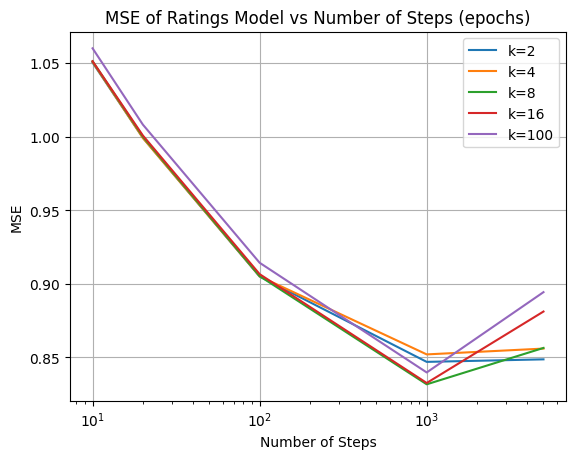

In [106]:
# plot the MSE for each K that was tried using the best hyperparameters found
for latent_feature in latent_features:
    n_epoch_steps = []
    mse_list = []
    for i in range(len(hyper_param_list_arr)):
        if hyper_param_list_arr[i][2] == latent_feature and hyper_param_list_arr[i][0] == 0.0002 and hyper_param_list_arr[i][1] == 0.02:
            n_epoch_steps.append(hyper_param_list_arr[i][3])
            mse_list.append(hyper_param_list_arr[i][-1]**2)
            # mse_list.append(hyper_param_list_arr[i][-1])
    plt.plot(n_epoch_steps, mse_list, label="k={}".format(latent_feature))

plt.xlabel('Number of Steps')
plt.ylabel('MSE')
plt.title('MSE of Ratings Model vs Number of Steps (epochs)')
plt.legend()
plt.xscale('log')
plt.grid()
plt.show()

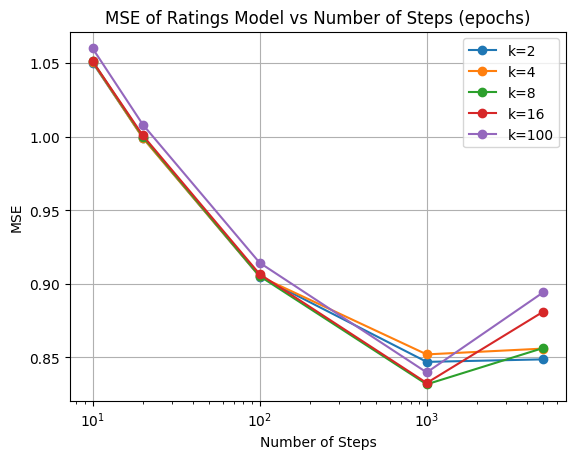

In [107]:
# plot the MSE for each K that was tried using the best hyperparameters found
for latent_feature in latent_features:
    n_epoch_steps = []
    mse_list = []
    for i in range(len(hyper_param_list_arr)):
        if hyper_param_list_arr[i][2] == latent_feature and hyper_param_list_arr[i][0] == 0.0002 and hyper_param_list_arr[i][1] == 0.02:
            n_epoch_steps.append(hyper_param_list_arr[i][3])
            mse_list.append(hyper_param_list_arr[i][-1]**2)
            # mse_list.append(hyper_param_list_arr[i][-1])
    plt.plot(n_epoch_steps, mse_list, label="k={}".format(latent_feature), marker='o')

plt.xlabel('Number of Steps')
plt.ylabel('MSE')
plt.title('MSE of Ratings Model vs Number of Steps (epochs)')
plt.legend()
plt.xscale('log')
plt.grid()
plt.show()